In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [3]:
df=pd.read_csv('soil_analysis_data.csv')

In [4]:
df.head()

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
0,Jaipur,Chalky (Calcareous),6.546096,1.569807,27.931972,29.438438,42.782766
1,Bhilwara,Nitrogenous,6.832259,2.243018,22.263480,25.413455,37.644377
2,Jodhpur,Sandy,7.453182,2.662898,23.564182,13.014409,37.082003
3,Jaipur,Clay,8.019189,1.240327,15.839222,17.744206,42.758704
4,Jaipur,Sandy,8.100131,1.768419,27.942867,25.769504,30.651292


In [5]:
df.columns

Index(['District', 'Soil_Type', 'pH_Level', 'Organic_Matter(%)',
       'Nitrogen_Content(kg/ha)', 'Phosphorus_Content(kg/ha)',
       'Potassium_Content(kg/ha)'],
      dtype='object')

In [6]:
df['District'].value_counts()

Jodhpur           128
Kota              114
Ajmer             106
Jaipur            103
Udaipur           103
Alwar              98
Sri Ganganagar     93
Bhilwara           85
Hanumangarh        85
Nagaur             85
Name: District, dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   District                   1000 non-null   object 
 1   Soil_Type                  1000 non-null   object 
 2   pH_Level                   1000 non-null   float64
 3   Organic_Matter(%)          1000 non-null   float64
 4   Nitrogen_Content(kg/ha)    1000 non-null   float64
 5   Phosphorus_Content(kg/ha)  1000 non-null   float64
 6   Potassium_Content(kg/ha)   1000 non-null   float64
dtypes: float64(5), object(2)
memory usage: 54.8+ KB


In [8]:
df.describe()

,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,7.495453,1.993592,29.883358,19.729932,39.877907
std,0.517155,0.515340,5.202697,5.067005,4.874751
min,5.889492,0.155817,11.994574,4.961838,24.116481
25%,7.157881,1.638911,26.217325,16.216471,36.703917
50%,7.500129,1.981462,29.822797,19.913737,39.796016
75%,7.846940,2.345688,33.232056,23.122285,43.382039
max,9.038430,3.764528,45.760284,35.588406,54.678290


In [9]:
df.isnull().sum()

District                     0
Soil_Type                    0
pH_Level                     0
Organic_Matter(%)            0
Nitrogen_Content(kg/ha)      0
Phosphorus_Content(kg/ha)    0
Potassium_Content(kg/ha)     0
dtype: int64

In [10]:
df.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
995    False
996    False
997    False
998    False
999    False
Length: 1000, dtype: bool

In [11]:
df.duplicated().sum()

0

In [12]:
df.shape

(1000, 7)

In [13]:
num_cols=[]
cat_cols=[]
for i in df.columns:
    if df[i].dtype=='object':
        cat_cols.append(i)
    else:
        num_cols.append(i)
    

In [14]:
num_cols

['pH_Level',
 'Organic_Matter(%)',
 'Nitrogen_Content(kg/ha)',
 'Phosphorus_Content(kg/ha)',
 'Potassium_Content(kg/ha)']

In [15]:
cat_cols

['District', 'Soil_Type']

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_countplot(data, x):
    plt.figure(figsize=(8, 6))
    sns.countplot(data=data, x=x)
    plt.title(f'Countplot of measurments from each{x}')
    plt.xticks(rotation=45)
    plt.show()

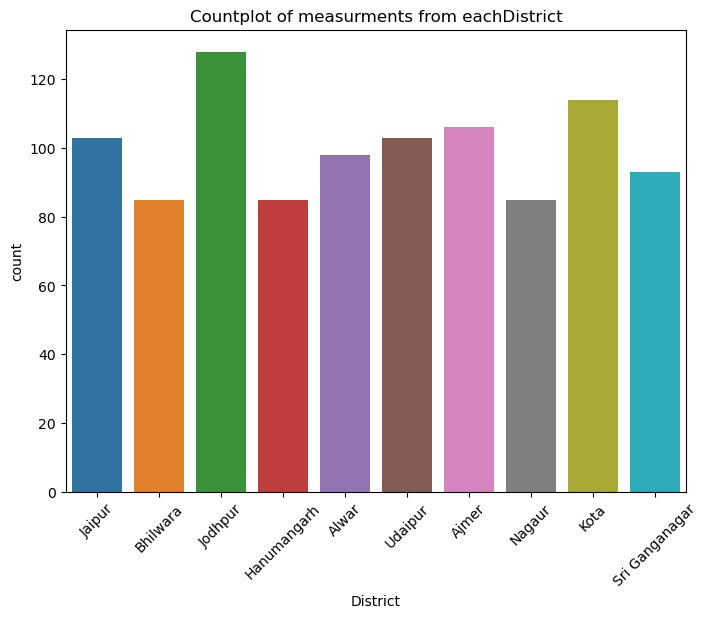

<Figure size 640x480 with 0 Axes>

In [28]:

plot_countplot(data=df,x='District')
plt.show()
plt.savefig("countplot_of_measurements_eachdistrict.png")

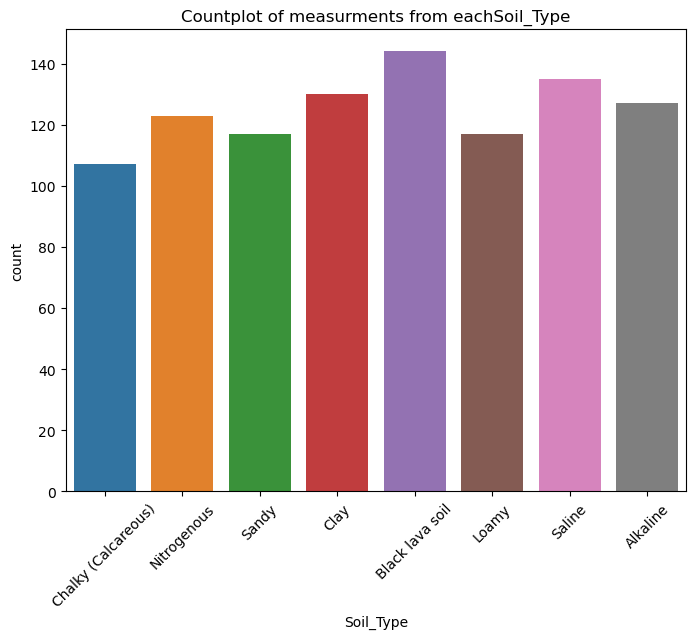

In [179]:
plot_countplot(data=df,x='Soil_Type')

In [180]:
def plot_barplot(data, x, y):
    plt.figure(figsize=(8, 6))
    sns.barplot(data=data, x=x, y=y)
    plt.title(f'Barplot of {x} vs {y}')
    plt.xticks(rotation=45)
    plt.show()

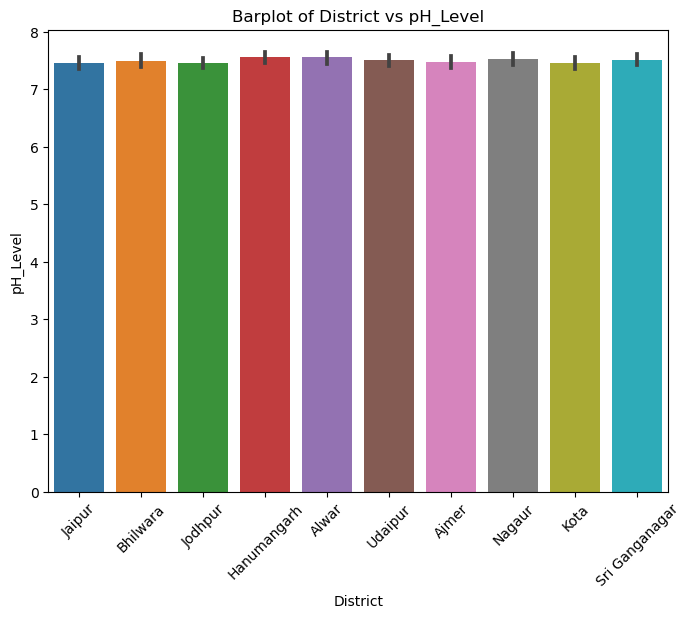

In [181]:
plot_barplot(data=df,x='District',y='pH_Level')

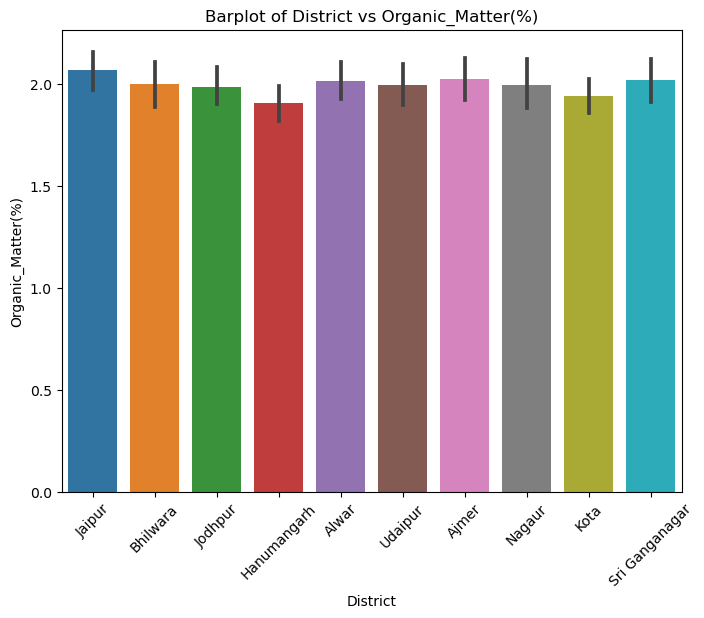

In [182]:
plot_barplot(data=df,x='District',y='Organic_Matter(%)')

In [183]:
num_cols

['pH_Level',
 'Organic_Matter(%)',
 'Nitrogen_Content(kg/ha)',
 'Phosphorus_Content(kg/ha)',
 'Potassium_Content(kg/ha)']

In [184]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_histograms_subplots(data, columns, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(20,16))
    fig.subplots_adjust(hspace=0.5)

    for i, column in enumerate(columns):
        row = i // cols
        col = i % cols
        ax = axes[row, col]
        sns.histplot(data=data[column], kde=True, ax=ax,color='green')
        ax.set_title(f'Histogram of {column}')
        ax.set_xlabel('')
        ax.set_ylabel('')

    # Remove empty subplots if the number of columns is less than rows*cols
    for i in range(len(columns), rows * cols):
        row = i // cols
        col = i % cols
        fig.delaxes(axes[row, col])

    plt.show()



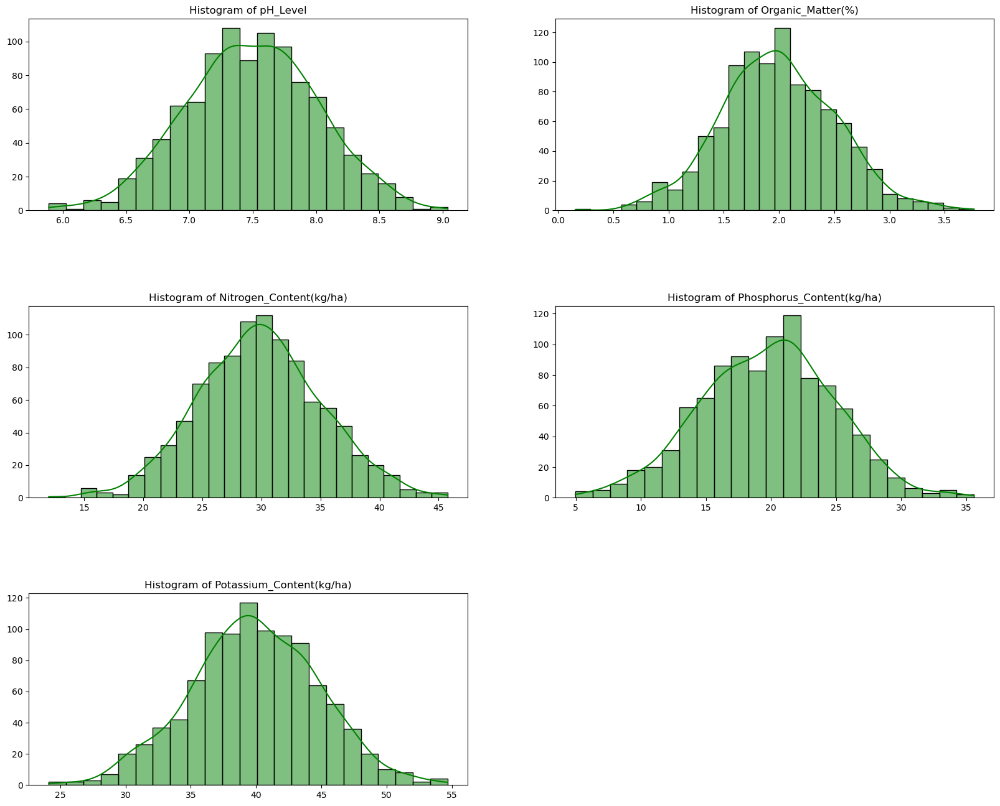

In [185]:
plot_histograms_subplots(data=df,columns=num_cols,rows=3,cols=2)

In [186]:
def plot_histograms_individual(data, columns):
    for column in columns:
        plt.figure(figsize=(8, 6))
        sns.histplot(data=data[column], kde=True)
        plt.title(f'Histogram of {column}')
        plt.xlabel('')
        plt.ylabel('')
        plt.show()

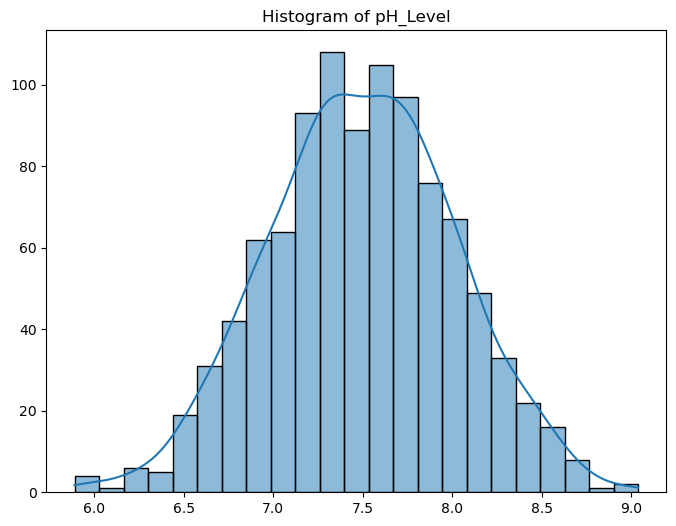

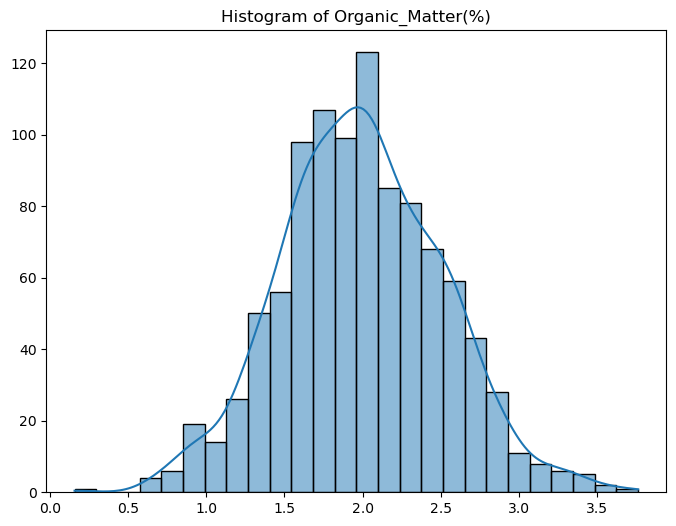

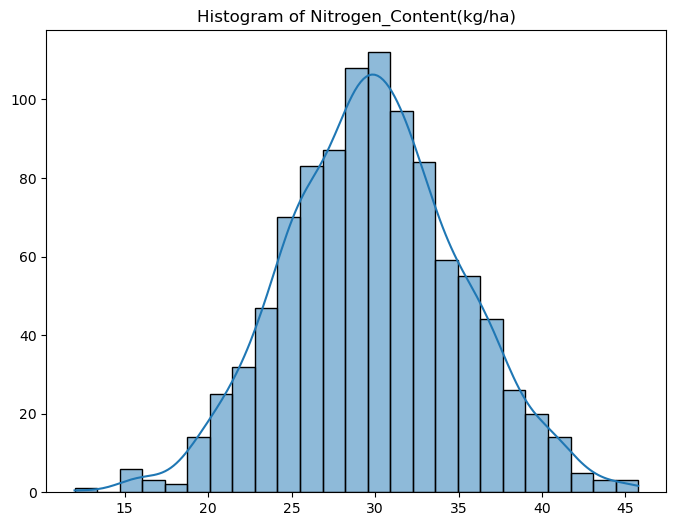

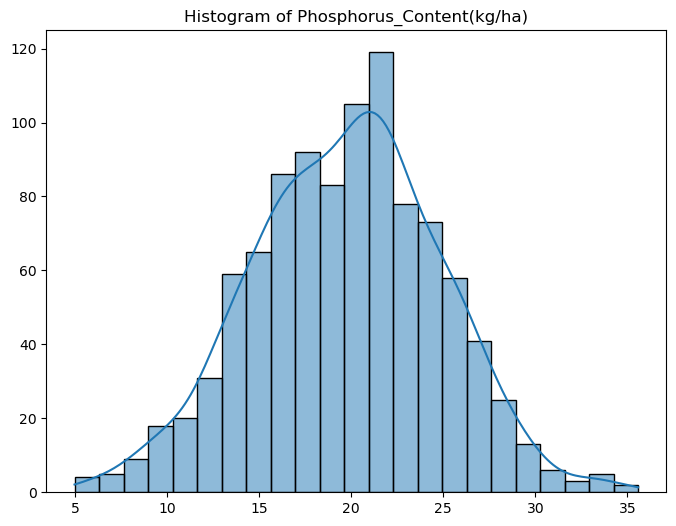

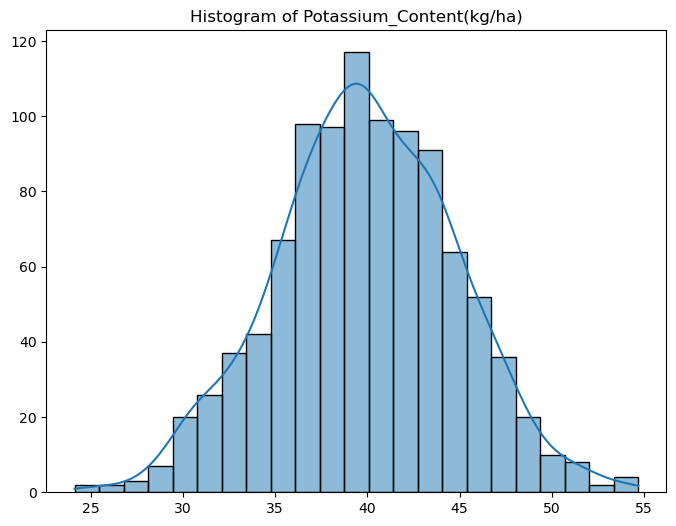

In [187]:
plot_histograms_individual(data=df,columns=num_cols)

In [188]:
def plot_scatter(data, x, y):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=data, x=x, y=y)
    plt.title(f'Scatter Plot of {x} vs {y}')
    plt.show()

'pH_Level',
 'Organic_Matter(%)',
 'Nitrogen_Content(kg/ha)',
 'Phosphorus_Content(kg/ha)',
 'Potassium_Content(kg/ha)'

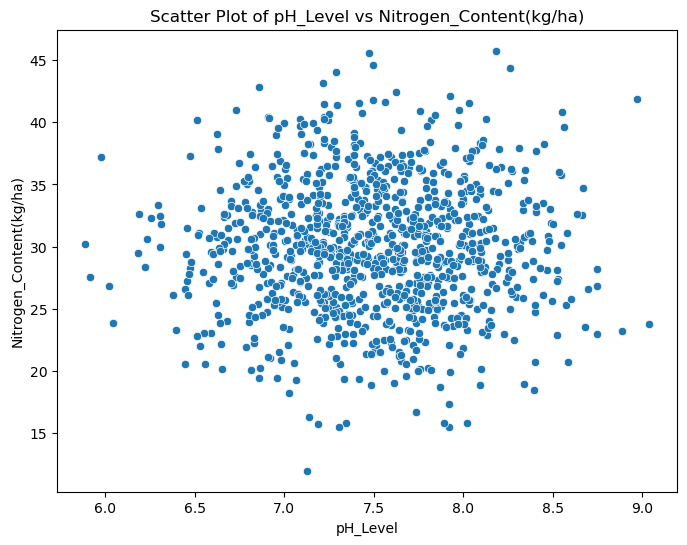

In [189]:
plot_scatter(data=df,x='pH_Level',y='Nitrogen_Content(kg/ha)')

In [29]:
def plot_boxplot_individual(data, columns):
    for column in columns:
        plt.figure(figsize=(8, 6))
        sns.boxplot(data=data[column],orient='h')
        plt.title(f'BOXPLOT of {column}')
        plt.xlabel('')
        plt.ylabel('')
        plt.show()

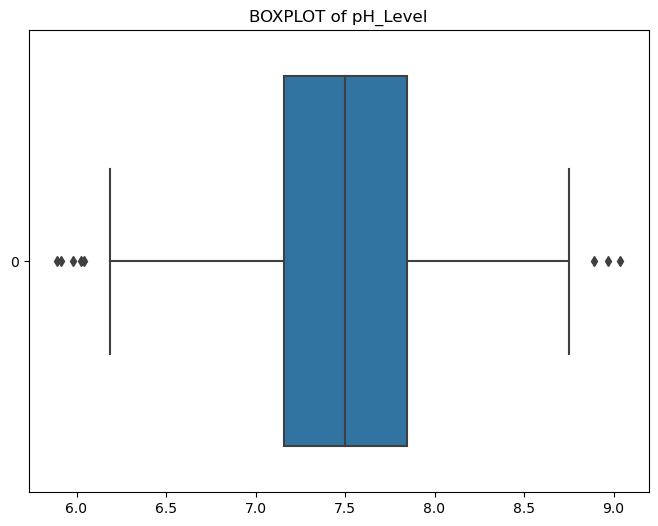

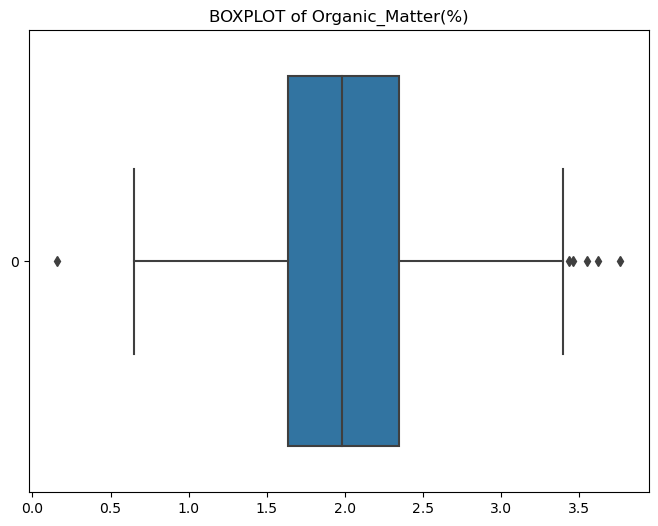

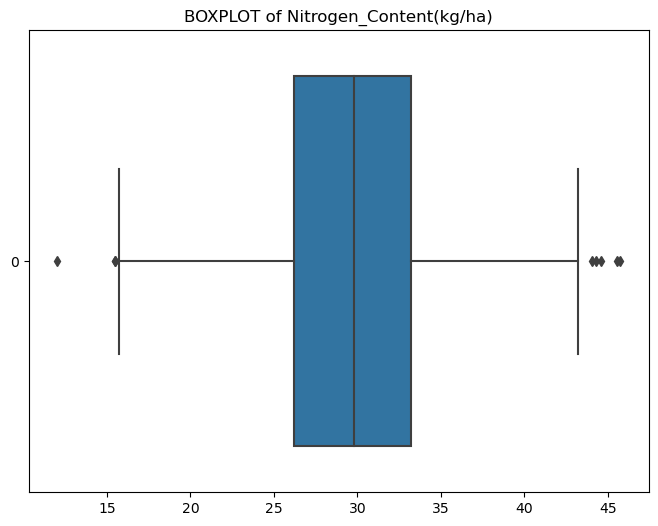

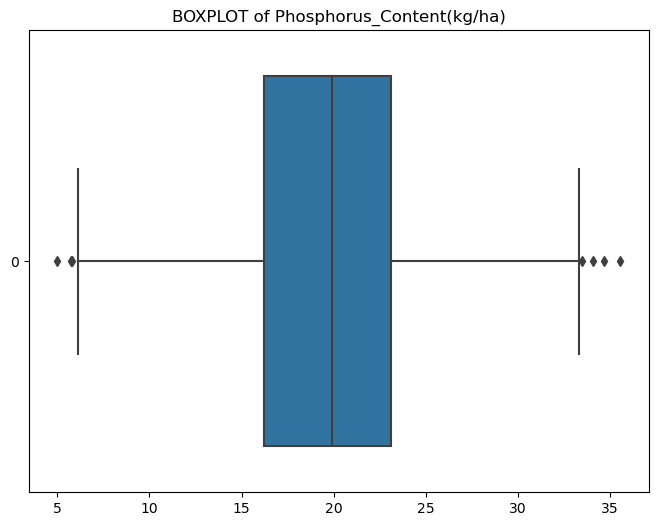

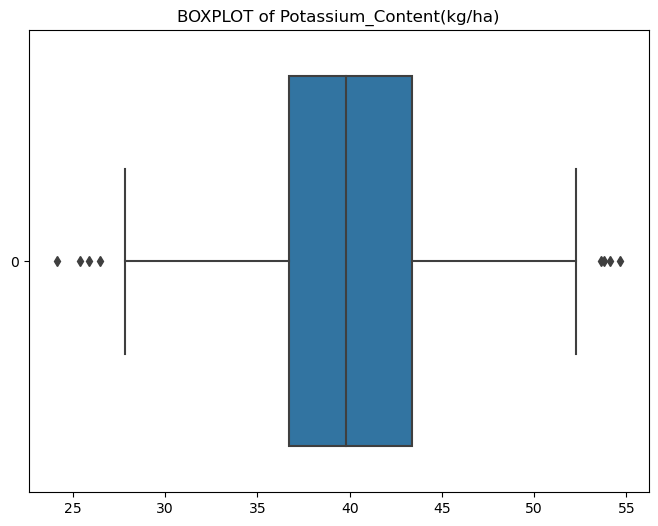

In [30]:
plot_boxplot_individual(data=df,columns=num_cols)

<Figure size 2000x1600 with 0 Axes>

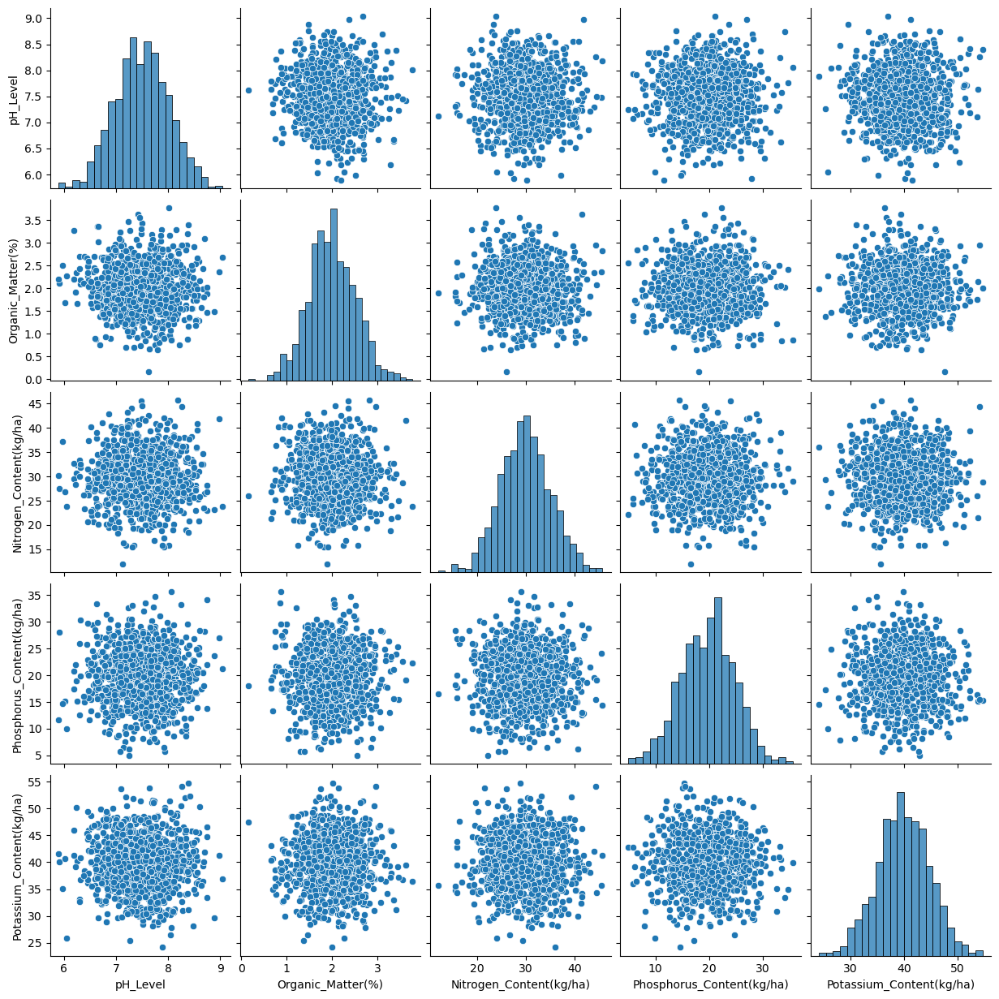

In [192]:
plt.figure(figsize=(20,16))
sns.pairplot(df)

In [193]:
df['District'].unique()

array(['Jaipur', 'Bhilwara', 'Jodhpur', 'Hanumangarh', 'Alwar', 'Udaipur',
       'Ajmer', 'Nagaur', 'Kota', 'Sri Ganganagar'], dtype=object)

In [32]:
df_jaipur=df[df['District']=='Jaipur']
df_bhilwara=df[df['District']=='Bhilwara']
df_Jodhpur=df[df['District']=='Jodhpur']
df_Hanumangarh=df[df['District']=='Hanumangarh']
df_Alwar=df[df['District']=='Alwar']
df_Udaipur=df[df['District']=='Udaipur']
df_Ajmer=df[df['District']=='Ajmer']
df_Nagaur=df[df['District']=='Nagaur']
df_Kota=df[df['District']=='Kota']
df_SriGanganagar=df[df['District']=='Sri Ganganagar']

In [33]:
print('shape of jaipur',df_jaipur.shape)
print('shape of bhilwara',df_bhilwara.shape)
print('shape of jodhpur',df_Jodhpur.shape)
print('shape of Hanumangarh',df_Hanumangarh.shape)
print('shape of Alwar',df_Alwar.shape)
print('shape of Udaipur',df_Udaipur.shape)
print('shape of Ajmer',df_Ajmer.shape)
print('shape of Nagaur',df_Nagaur.shape)
print('shape of Kota',df_Kota.shape)
print('shape of Sri Ganganagar',df_SriGanganagar.shape)

shape of jaipur (103, 7)
shape of bhilwara (85, 7)
shape of jodhpur (128, 7)
shape of Hanumangarh (85, 7)
shape of Alwar (98, 7)
shape of Udaipur (103, 7)
shape of Ajmer (106, 7)
shape of Nagaur (85, 7)
shape of Kota (114, 7)
shape of Sri Ganganagar (93, 7)


In [34]:
import warnings
warnings.filterwarnings('ignore')

# analysis of ajmer district

<Axes: >

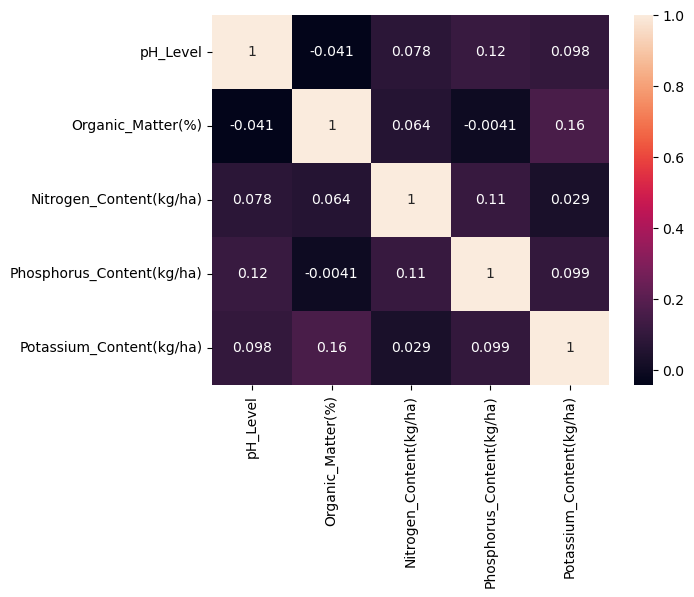

In [35]:
sns.heatmap(df_Ajmer.corr(),annot=True)

### observation
- In ajmer district the phosphorus content and organic matter are negatively coorelated

In [36]:
df_Ajmer

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
12,Ajmer,Loamy,7.658727,1.833570,29.533066,17.353339,32.427648
21,Ajmer,Loamy,7.680709,1.353429,32.861952,22.253017,30.650918
24,Ajmer,Sandy,7.258219,1.693917,32.456038,18.209853,39.303014
28,Ajmer,Nitrogenous,7.923385,0.936386,29.504528,16.985897,42.161315
41,Ajmer,Chalky (Calcareous),7.161502,1.613670,34.150959,24.501993,42.256127
...,...,...,...,...,...,...,...
935,Ajmer,Clay,7.128757,1.892731,11.994574,16.493552,35.620926
956,Ajmer,Clay,7.306944,2.507610,30.539920,33.034296,40.967032
974,Ajmer,Loamy,8.263406,2.951279,44.326060,15.490037,54.121102
987,Ajmer,Alkaline,7.924792,0.890715,42.093889,27.477291,38.576872


In [37]:
df_Ajmer['Soil_Type'].value_counts()

Sandy                  18
Black lava soil        18
Saline                 14
Loamy                  12
Clay                   12
Chalky (Calcareous)    11
Alkaline               11
Nitrogenous            10
Name: Soil_Type, dtype: int64

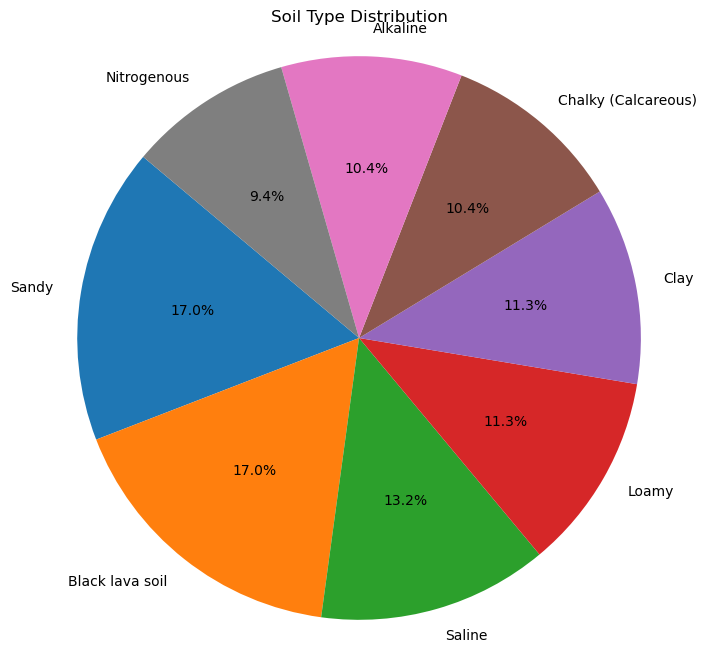

In [38]:
value_counts = df_Ajmer['Soil_Type'].value_counts()
percentages = (value_counts / value_counts.sum()) * 100
# Create the pie plot
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
# Add a title
plt.title('Soil Type Distribution')
# Show the plot
plt.show()

### OBSERVATION
- In ajmer district the major contribution of Sandy and Black lava soil has <b>34%</b> share

<Axes: xlabel='pH_Level', ylabel='Count'>

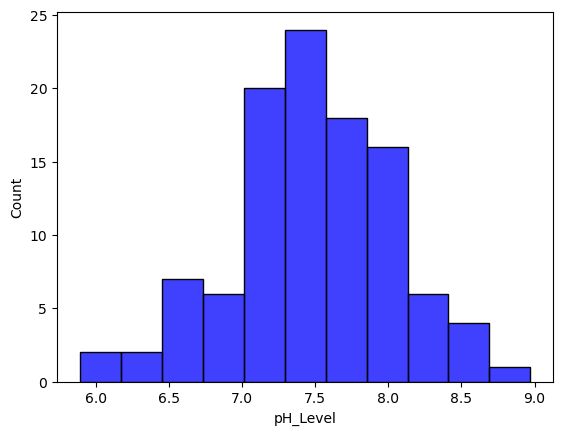

In [39]:
sns.histplot(df_Ajmer['pH_Level'],color='blue')

### observation
- The average ph value of lands in ajmer district ranges from <b>7.0-8.0</b>

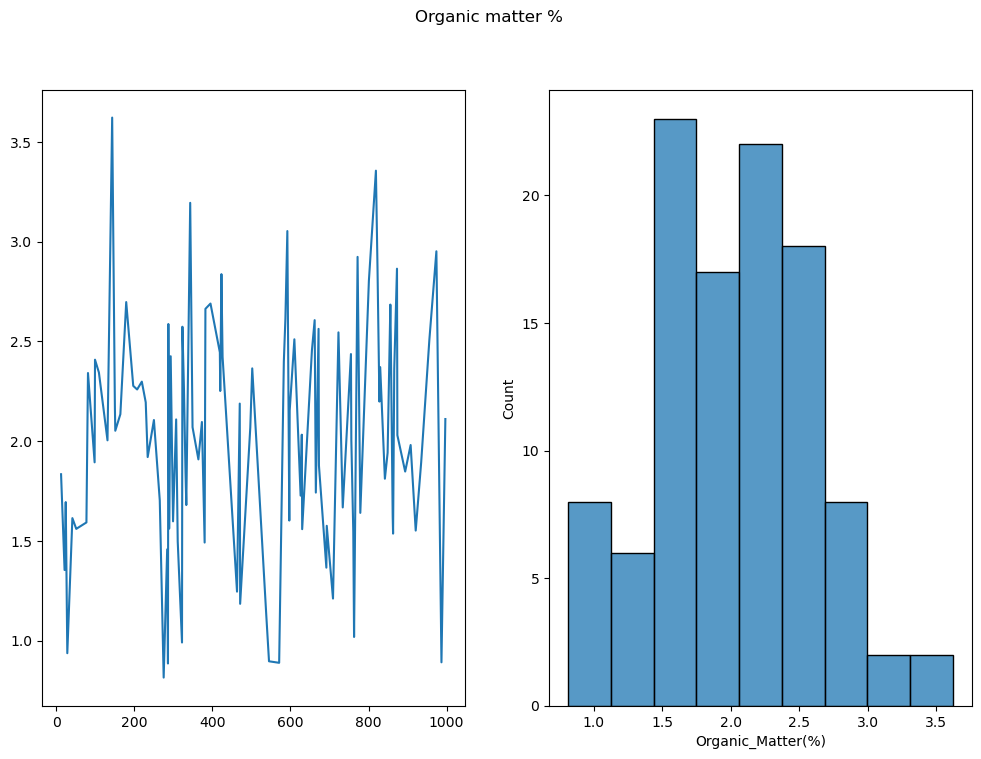

In [40]:
plt.figure(figsize=(12,8))
plt.suptitle('Organic matter % ')
plt.subplot(1,2,1)
plt.plot(df_Ajmer['Organic_Matter(%)'])
plt.subplot(1,2,2)
sns.histplot(df_Ajmer['Organic_Matter(%)'])
plt.show()

### observation
- The agricultural lands of ajmer has <b>least organic matter</b> which says they are not much fertile 

Text(0.5, 1.0, 'pottasium kg per hectare')

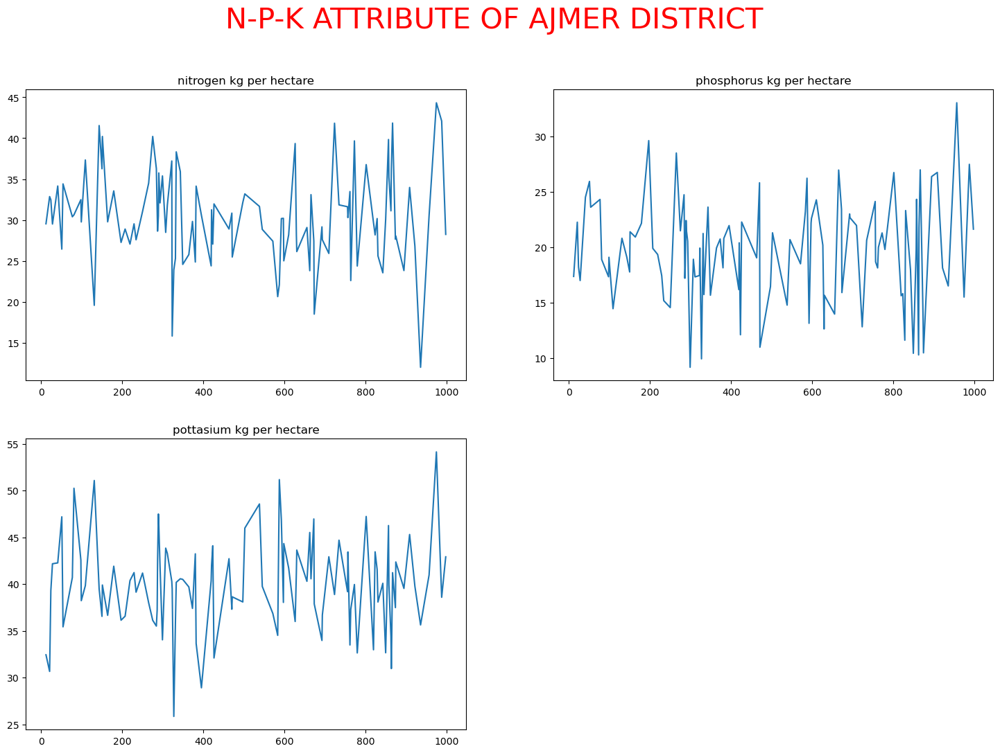

In [41]:
plt.figure(figsize=(18,12))
plt.suptitle('N-P-K ATTRIBUTE OF AJMER DISTRICT',fontsize=30,c='r')
plt.subplot(2,2,1)
plt.plot(df_Ajmer['Nitrogen_Content(kg/ha)'])
plt.title('nitrogen kg per hectare')
plt.subplot(2,2,2)
plt.plot(df_Ajmer['Phosphorus_Content(kg/ha)'])
plt.title('phosphorus kg per hectare')
plt.subplot(2,2,3)
plt.plot(df_Ajmer['Potassium_Content(kg/ha)'])
plt.title('pottasium kg per hectare')


### observation
- as per the observation the lands of ajmer  are <b>phosphorus rich</b>
- poor when it comes to <i>pottasium and nitrogen</i>

### ANALYSIS OF ALWAR DISTRICT

In [204]:
df_Alwar

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
7,Alwar,Clay,7.723436,1.828725,30.852319,15.186337,38.966944
13,Alwar,Black lava soil,7.660797,2.877467,30.092008,21.126321,43.463614
29,Alwar,Saline,7.735022,1.646187,26.439131,19.446673,35.516789
32,Alwar,Clay,7.196748,2.227952,27.704548,16.526998,34.228187
53,Alwar,Black lava soil,8.470609,1.560838,28.109961,21.157230,43.232448
61,Alwar,Sandy,8.030685,2.266003,31.808305,28.805941,39.998432
64,Alwar,Black lava soil,7.598066,1.547966,22.255197,21.289880,45.519387
83,Alwar,Clay,7.426487,2.420367,31.039013,13.536873,37.339157
88,Alwar,Black lava soil,7.572761,1.692939,30.704913,27.943135,43.477012
102,Alwar,Alkaline,8.110411,1.561613,38.560201,11.261817,42.173850


In [205]:
df_Alwar['Soil_Type'].value_counts()

Black lava soil        18
Saline                 15
Nitrogenous            14
Clay                   13
Sandy                  11
Loamy                  10
Alkaline                9
Chalky (Calcareous)     8
Name: Soil_Type, dtype: int64

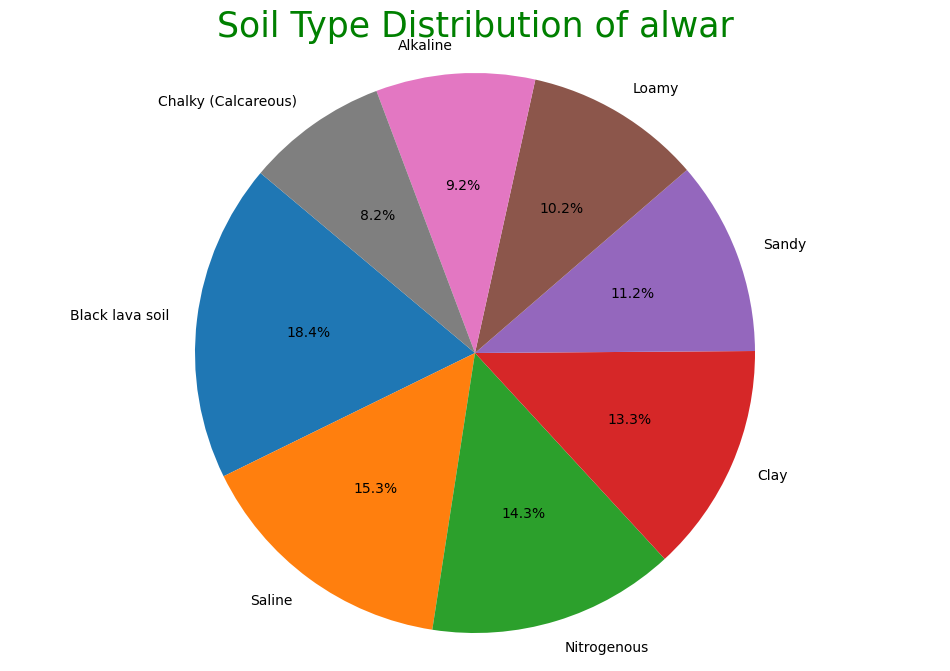

In [206]:
value_counts = df_Alwar['Soil_Type'].value_counts()
percentages = (value_counts / value_counts.sum()) * 100
# Create the pie plot
plt.figure(figsize=(12, 8))
plt.pie(percentages, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
# Add a title
plt.title('Soil Type Distribution of alwar',fontsize=25,c='g')
# Show the plot
plt.show()

## observation
- Black lava soil lands are highly occupied in alwar district
- where saline , Nitrogenous and clay lands have 2nd,3rd and 4th most contributions for lands in alwar

<Axes: xlabel='pH_Level', ylabel='Count'>

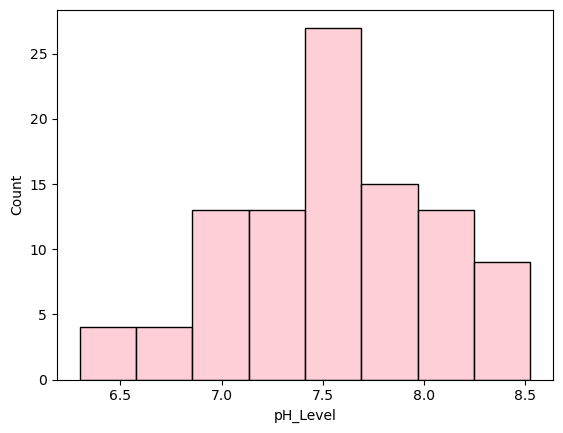

In [207]:
sns.histplot(df_Alwar['pH_Level'],color='pink')

### obervation
- Slightly Alkaline Soil (pH 7 to 7.5):
 - Slightly alkaline soils can also support good plant growth. Some crops may prefer slightly alkaline conditions, but this range is generally suitable for a wide range of crops.

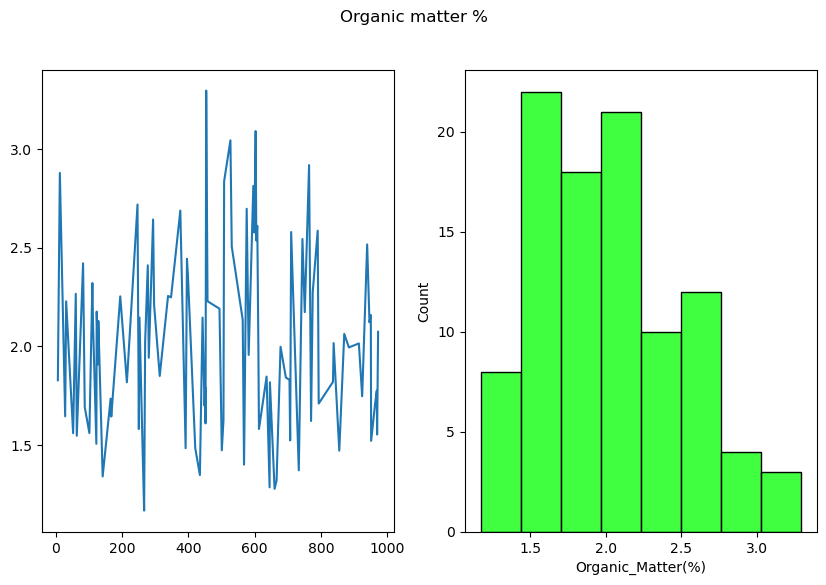

In [208]:
plt.figure(figsize=(10,6))
plt.suptitle('Organic matter % ')
plt.subplot(1,2,1)
plt.plot(df_Alwar['Organic_Matter(%)'])
plt.subplot(1,2,2)
sns.histplot(df_Alwar['Organic_Matter(%)'],color='lime')
plt.show()

### observation
- Soil organic matter content is an important factor in classifying soil types. Organic matter content can vary, and a range of 2-3% organic matter is typically associated with soils classified as "loam" or "silt loam."
- Loam Soil: Loam soil is often described as the ideal soil type for agriculture. It typically consists of a balanced mixture of sand, silt, and clay particles, and it contains a good amount of organic matter. Soils with organic matter content in the 2-3% range are often classified as loam.

Text(0.5, 1.0, 'pottasium kg per hectare')

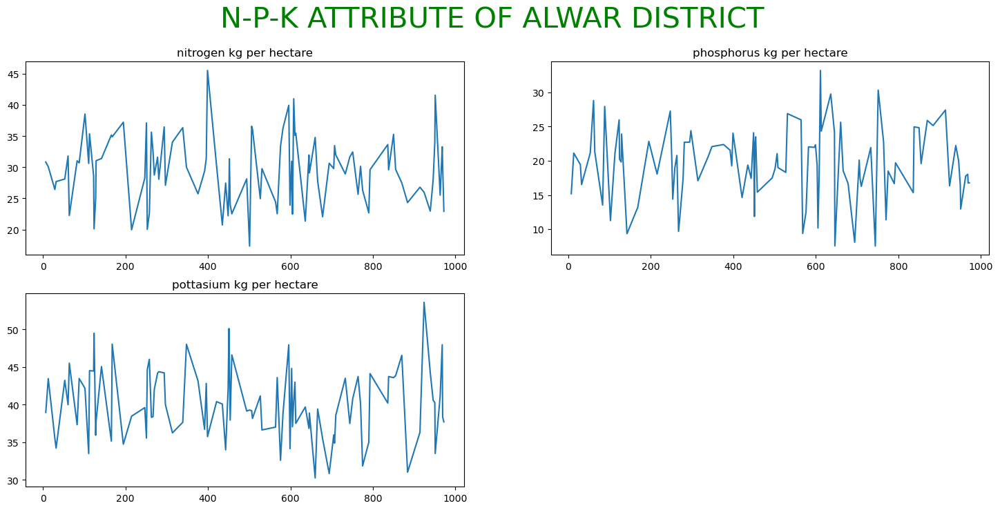

In [42]:
plt.figure(figsize=(18,8))
plt.suptitle('N-P-K ATTRIBUTE OF ALWAR DISTRICT',fontsize=30,c='green')
plt.subplot(2,2,1)
plt.plot(df_Alwar['Nitrogen_Content(kg/ha)'])
plt.title('nitrogen kg per hectare')
plt.subplot(2,2,2)
plt.plot(df_Alwar['Phosphorus_Content(kg/ha)'])
plt.title('phosphorus kg per hectare')
plt.subplot(2,2,3)
plt.plot(df_Alwar['Potassium_Content(kg/ha)'])
plt.title('pottasium kg per hectare')


### observation
- as per the observation the lands of almar  are <b>phosphorus rich</b>
- has good levels of <b>potaasium</b> which suits lands for irrigation
- poor when it comes to <i>nitrogen</i>

<Axes: >

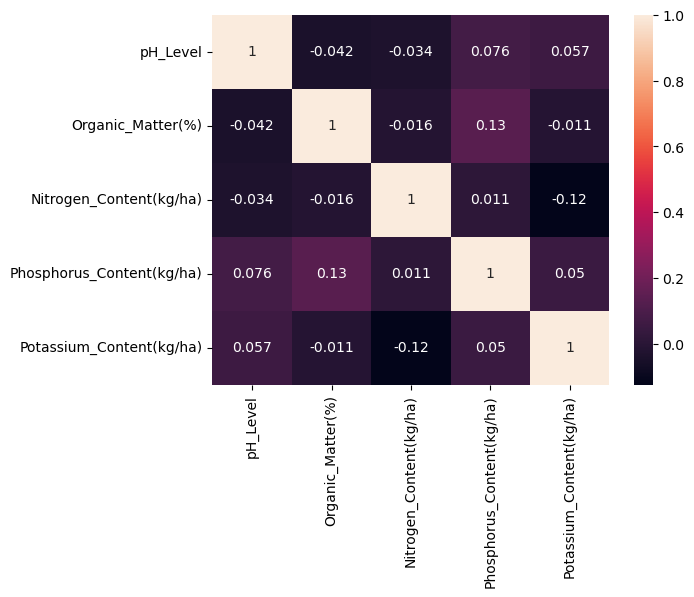

In [210]:
sns.heatmap(df_Alwar.corr(),annot=True)

### observation
- The nitrogen content vs organic matter and  ph level are negatively correlated 
- the pottasium content with organic matter is also negatively correalted

## analysis on bhilwara district

In [211]:
df_bhilwara

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
1,Bhilwara,Nitrogenous,6.832259,2.243018,22.263480,25.413455,37.644377
8,Bhilwara,Nitrogenous,7.805108,2.078486,27.067344,21.121082,43.573049
17,Bhilwara,Black lava soil,7.654999,1.971706,36.094854,10.244491,40.717940
22,Bhilwara,Nitrogenous,6.919108,1.858431,28.495701,13.952615,41.944894
31,Bhilwara,Saline,6.684362,1.381287,30.547042,26.643204,41.565922
71,Bhilwara,Nitrogenous,7.417184,2.039289,19.356330,22.290841,35.101394
87,Bhilwara,Loamy,7.944519,2.286872,23.618478,13.558462,41.463577
96,Bhilwara,Nitrogenous,7.348910,0.698431,28.193447,19.679079,34.947009
114,Bhilwara,Black lava soil,7.351259,2.655992,31.603929,20.970260,33.649695
119,Bhilwara,Chalky (Calcareous),8.073220,1.513311,35.035667,21.680725,38.862619


In [212]:
df_bhilwara['Soil_Type'].value_counts()

Alkaline               17
Nitrogenous            14
Saline                 12
Sandy                  10
Black lava soil         9
Loamy                   8
Clay                    8
Chalky (Calcareous)     7
Name: Soil_Type, dtype: int64

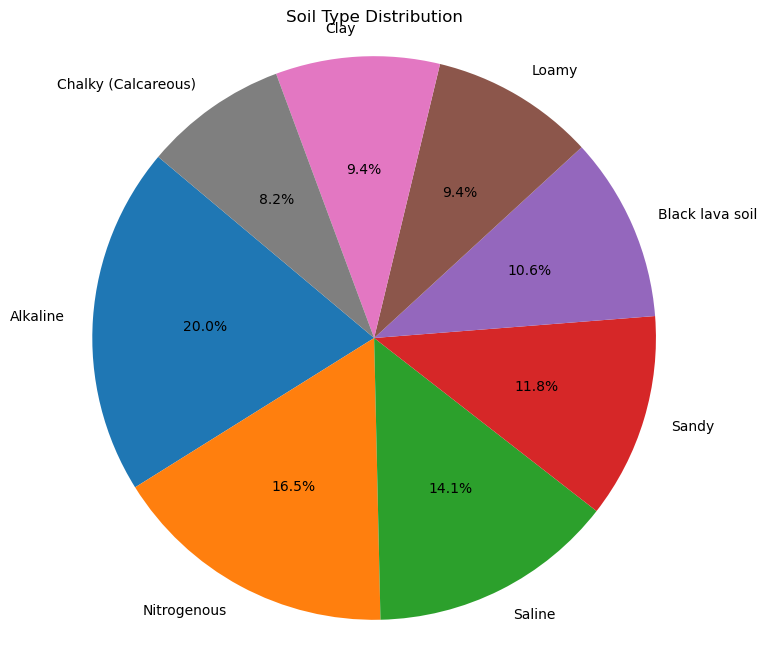

In [213]:
value_counts = df_bhilwara['Soil_Type'].value_counts()
percentages = (value_counts / value_counts.sum()) * 100
# Create the pie plot
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
# Add a title
plt.title('Soil Type Distribution')
# Show the plot
plt.show()

<Axes: xlabel='pH_Level', ylabel='Count'>

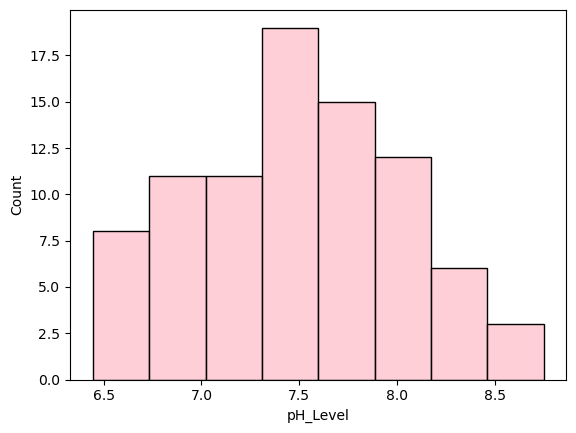

In [214]:
sns.histplot(df_bhilwara['pH_Level'],color='pink')

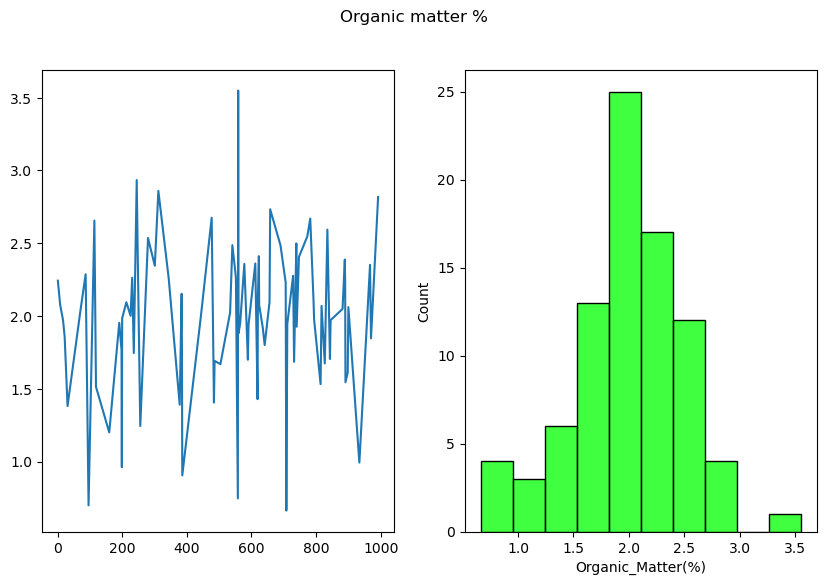

In [215]:
plt.figure(figsize=(10,6))
plt.suptitle('Organic matter % ')
plt.subplot(1,2,1)
plt.plot(df_bhilwara['Organic_Matter(%)'])
plt.subplot(1,2,2)
sns.histplot(df_bhilwara['Organic_Matter(%)'],color='lime')
plt.show()

Text(0.5, 1.0, 'pottasium kg per hectare')

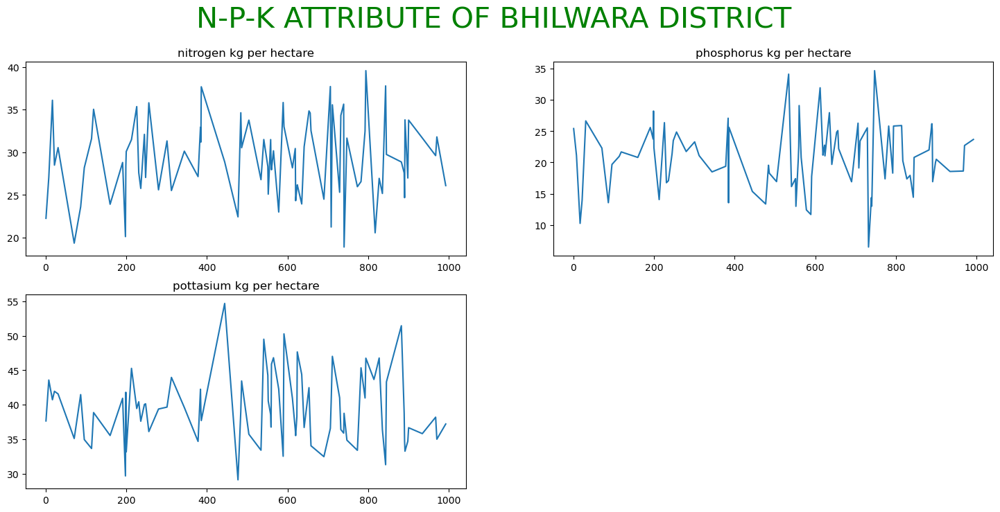

In [43]:
plt.figure(figsize=(18,8))
plt.suptitle('N-P-K ATTRIBUTE OF BHILWARA DISTRICT',fontsize=30,c='green')
plt.subplot(2,2,1)
plt.plot(df_bhilwara['Nitrogen_Content(kg/ha)'])
plt.title('nitrogen kg per hectare')
plt.subplot(2,2,2)
plt.plot(df_bhilwara['Phosphorus_Content(kg/ha)'])
plt.title('phosphorus kg per hectare')
plt.subplot(2,2,3)
plt.plot(df_bhilwara['Potassium_Content(kg/ha)'])
plt.title('pottasium kg per hectare')


<Axes: >

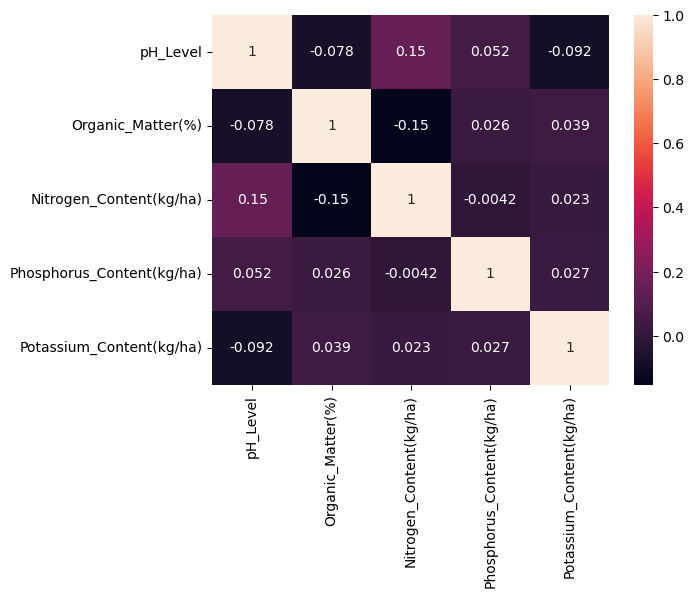

In [217]:
sns.heatmap(df_bhilwara.corr(),annot=True)

## analysis of Hanumangarh district

In [218]:
df_Hanumangarh

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
6,Hanumangarh,Sandy,6.255836,1.670876,32.267544,15.088530,40.294921
20,Hanumangarh,Clay,7.146554,2.427778,38.247404,25.353053,36.351988
23,Hanumangarh,Black lava soil,7.625737,1.902865,26.221042,25.243536,48.277036
37,Hanumangarh,Nitrogenous,8.165287,1.401606,34.468488,24.464769,49.148101
40,Hanumangarh,Chalky (Calcareous),7.592588,2.212722,31.111449,26.394329,35.238418
49,Hanumangarh,Nitrogenous,7.885960,2.220654,26.334219,21.144982,30.710493
85,Hanumangarh,Black lava soil,8.031970,2.126284,36.922660,22.220992,45.506615
91,Hanumangarh,Black lava soil,8.526486,2.544385,28.118496,20.094095,34.141728
138,Hanumangarh,Clay,7.766680,2.419734,36.090974,25.286842,44.360985
145,Hanumangarh,Nitrogenous,7.791369,2.248437,35.348857,14.001512,28.419281


In [219]:
df_Hanumangarh['Soil_Type'].value_counts()

Nitrogenous            14
Alkaline               14
Clay                   12
Loamy                  12
Black lava soil        11
Chalky (Calcareous)     9
Saline                  8
Sandy                   5
Name: Soil_Type, dtype: int64

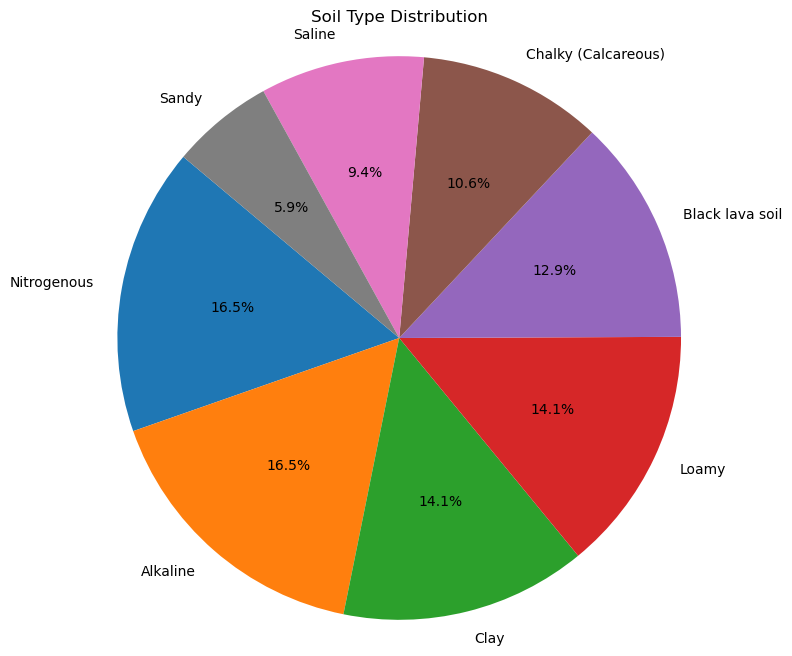

In [220]:
value_counts = df_Hanumangarh['Soil_Type'].value_counts()
percentages = (value_counts / value_counts.sum()) * 100
# Create the pie plot
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
# Add a title
plt.title('Soil Type Distribution')
# Show the plot
plt.show()

<Axes: xlabel='pH_Level', ylabel='Count'>

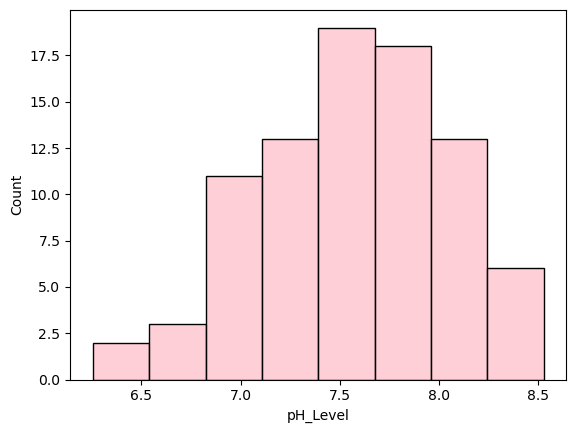

In [221]:
sns.histplot(df_Hanumangarh['pH_Level'],color='pink')

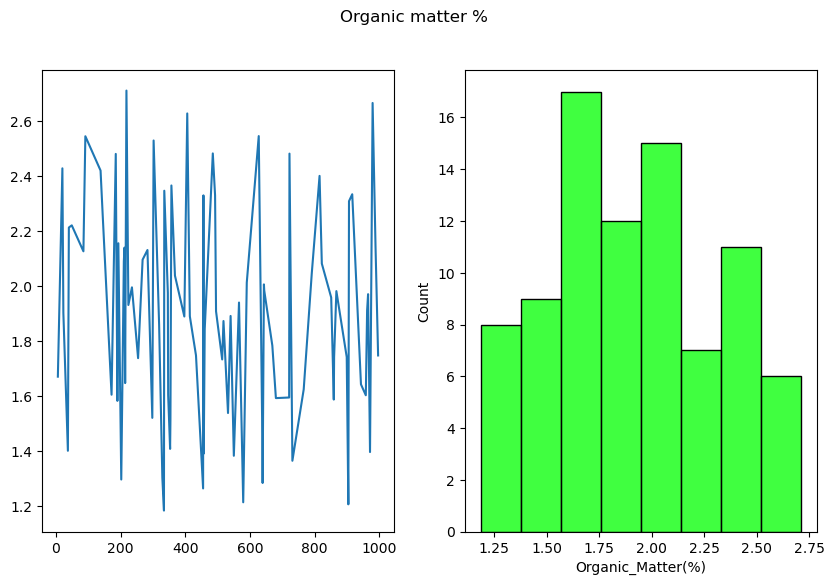

In [222]:
plt.figure(figsize=(10,6))
plt.suptitle('Organic matter % ')
plt.subplot(1,2,1)
plt.plot(df_Hanumangarh['Organic_Matter(%)'])
plt.subplot(1,2,2)
sns.histplot(df_Hanumangarh['Organic_Matter(%)'],color='lime')
plt.show()

Text(0.5, 1.0, 'pottasium kg per hectare')

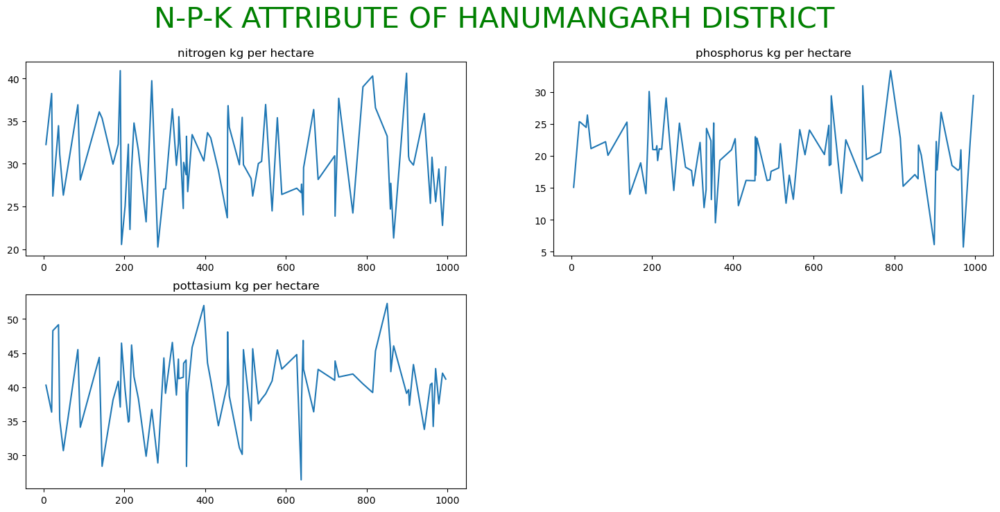

In [44]:
plt.figure(figsize=(18,8))
plt.suptitle('N-P-K ATTRIBUTE OF HANUMANGARH DISTRICT',fontsize=30,c='green')
plt.subplot(2,2,1)
plt.plot(df_Hanumangarh['Nitrogen_Content(kg/ha)'])
plt.title('nitrogen kg per hectare')
plt.subplot(2,2,2)
plt.plot(df_Hanumangarh['Phosphorus_Content(kg/ha)'])
plt.title('phosphorus kg per hectare')
plt.subplot(2,2,3)
plt.plot(df_Hanumangarh['Potassium_Content(kg/ha)'])
plt.title('pottasium kg per hectare')


<Axes: >

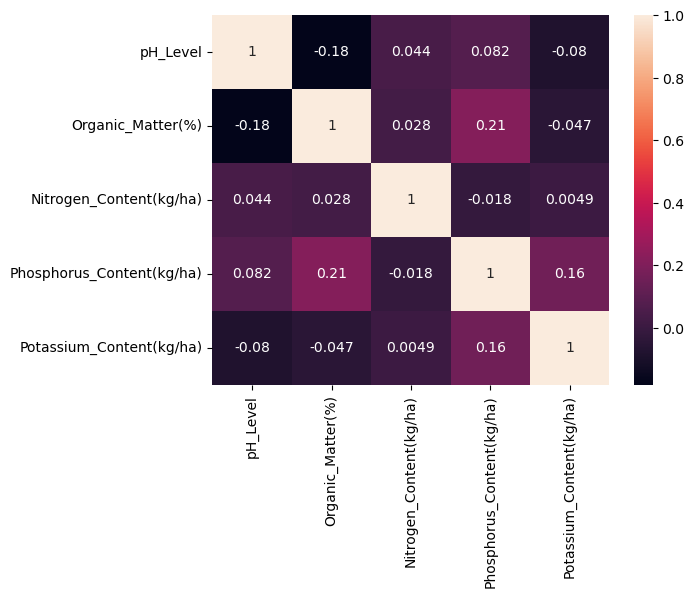

In [224]:
sns.heatmap(df_Hanumangarh.corr(),annot=True)

## analysis on jaipur district

In [225]:
df_jaipur

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
0,Jaipur,Chalky (Calcareous),6.546096,1.569807,27.931972,29.438438,42.782766
3,Jaipur,Clay,8.019189,1.240327,15.839222,17.744206,42.758704
4,Jaipur,Sandy,8.100131,1.768419,27.942867,25.769504,30.651292
44,Jaipur,Alkaline,6.974930,2.378748,36.852681,23.476015,41.418755
68,Jaipur,Nitrogenous,7.853039,1.878659,24.868154,26.150003,35.176473
79,Jaipur,Loamy,6.807006,2.252795,37.445566,31.357249,37.978013
103,Jaipur,Saline,7.737715,1.602221,32.121970,26.397593,28.915906
120,Jaipur,Nitrogenous,7.088032,1.640445,40.249060,20.003414,43.910650
133,Jaipur,Nitrogenous,6.871066,2.365690,32.952110,19.289267,41.693437
135,Jaipur,Alkaline,7.536437,2.036598,29.248785,25.958537,39.581410


In [226]:
df_jaipur['Soil_Type'].value_counts()

Loamy                  16
Clay                   14
Alkaline               14
Sandy                  13
Chalky (Calcareous)    12
Saline                 12
Nitrogenous            11
Black lava soil        11
Name: Soil_Type, dtype: int64

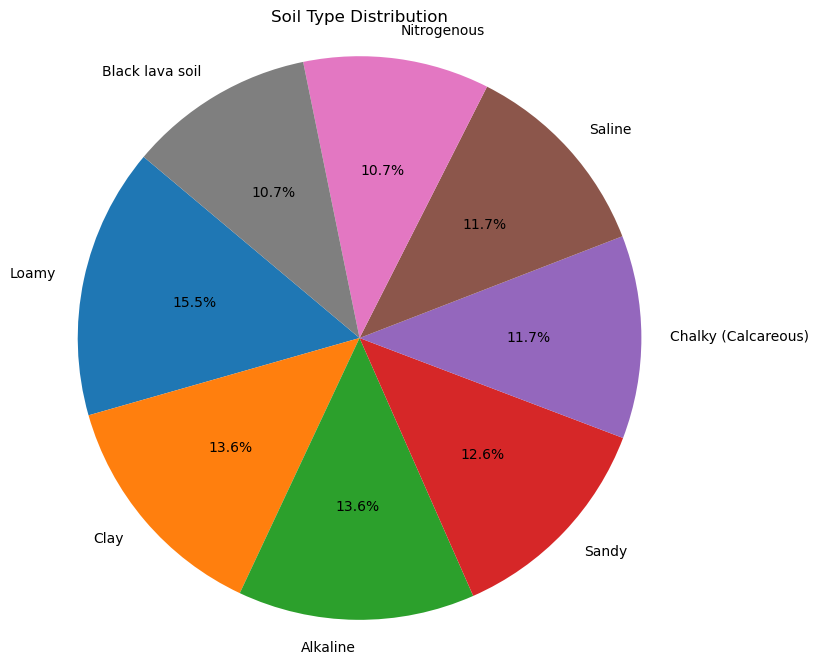

In [227]:
value_counts = df_jaipur['Soil_Type'].value_counts()
percentages = (value_counts / value_counts.sum()) * 100
# Create the pie plot
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
# Add a title
plt.title('Soil Type Distribution')
# Show the plot
plt.show()

<Axes: xlabel='pH_Level', ylabel='Count'>

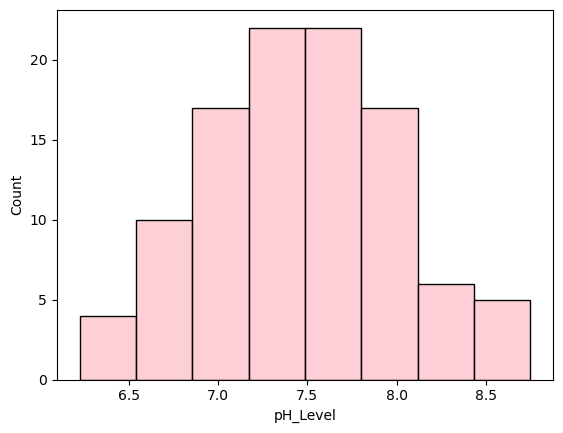

In [228]:
sns.histplot(df_jaipur['pH_Level'],color='pink')

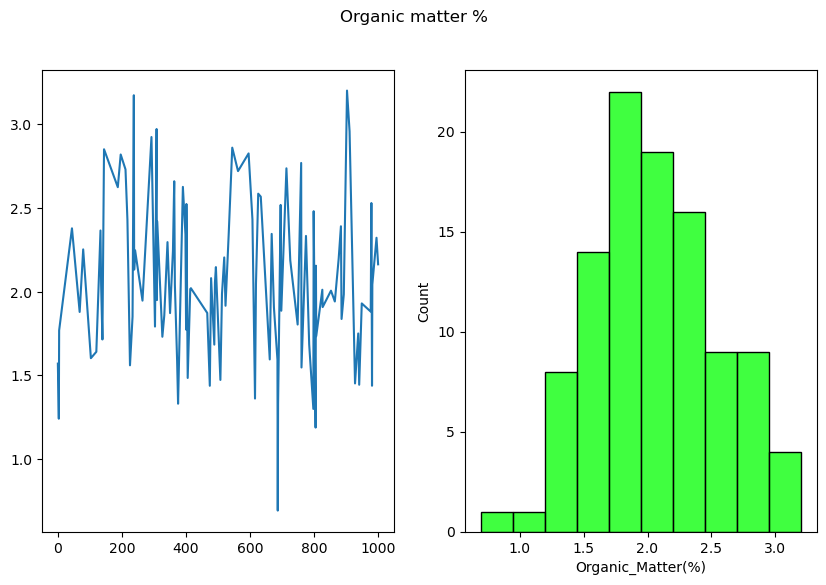

In [229]:
plt.figure(figsize=(10,6))
plt.suptitle('Organic matter % ')
plt.subplot(1,2,1)
plt.plot(df_jaipur['Organic_Matter(%)'])
plt.subplot(1,2,2)
sns.histplot(df_jaipur['Organic_Matter(%)'],color='lime')
plt.show()

Text(0.5, 1.0, 'pottasium kg per hectare')

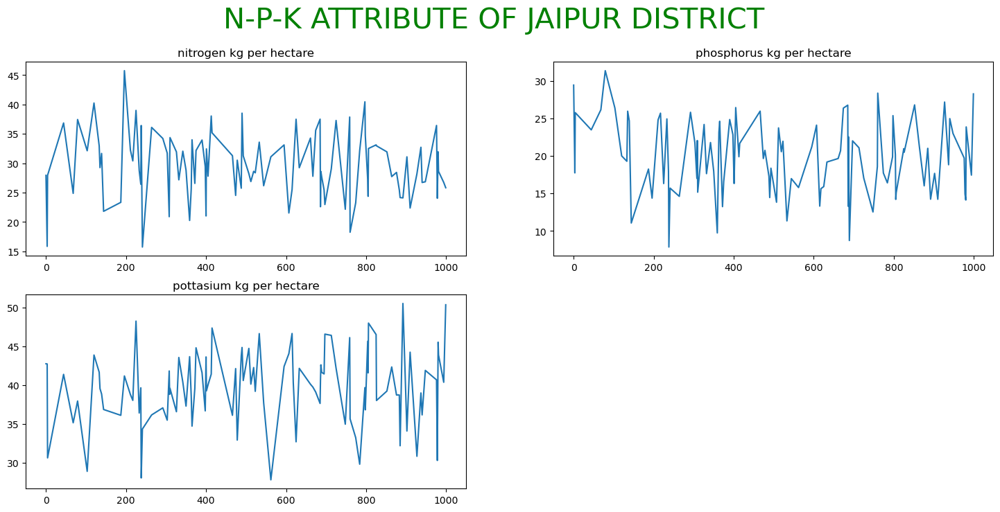

In [45]:
plt.figure(figsize=(18,8))
plt.suptitle('N-P-K ATTRIBUTE OF JAIPUR DISTRICT',fontsize=30,c='green')
plt.subplot(2,2,1)
plt.plot(df_jaipur['Nitrogen_Content(kg/ha)'])
plt.title('nitrogen kg per hectare')
plt.subplot(2,2,2)
plt.plot(df_jaipur['Phosphorus_Content(kg/ha)'])
plt.title('phosphorus kg per hectare')
plt.subplot(2,2,3)
plt.plot(df_jaipur['Potassium_Content(kg/ha)'])
plt.title('pottasium kg per hectare')


<Axes: >

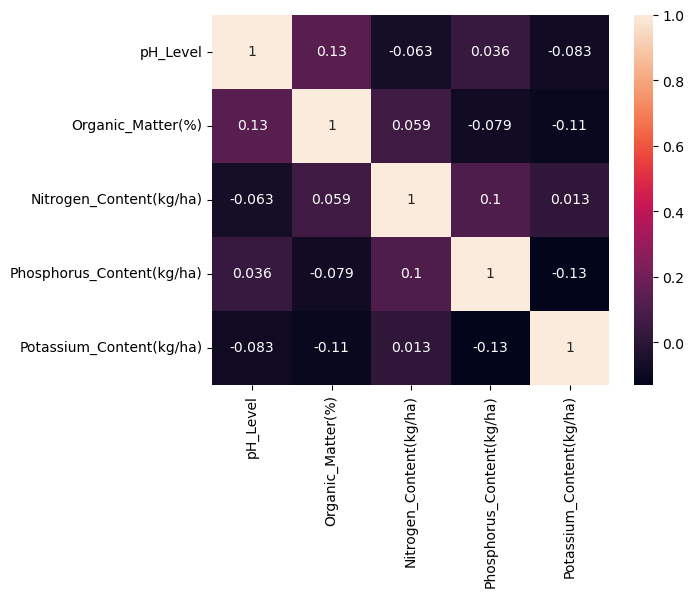

In [231]:
sns.heatmap(df_jaipur.corr(),annot=True)

### analysis on jodhpur lands

In [232]:
df_Jodhpur

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
2,Jodhpur,Sandy,7.453182,2.662898,23.564182,13.014409,37.082003
5,Jodhpur,Chalky (Calcareous),7.305740,2.095212,32.246094,17.450967,40.172205
16,Jodhpur,Sandy,8.100266,2.070180,20.164651,14.414068,39.070771
36,Jodhpur,Clay,7.989211,2.261071,24.481651,18.346054,36.099004
39,Jodhpur,Nitrogenous,6.559995,2.356356,20.584249,18.138405,42.186566
43,Jodhpur,Black lava soil,8.390899,1.171688,27.377759,16.323483,43.607397
48,Jodhpur,Alkaline,7.506250,3.434202,21.657004,25.293643,39.135991
50,Jodhpur,Loamy,7.801624,2.149079,33.193301,25.290592,41.838099
57,Jodhpur,Saline,8.251710,1.834940,28.941665,16.861330,38.559806
59,Jodhpur,Loamy,6.962344,2.838197,25.272466,14.233247,45.686573


In [233]:
df_Jodhpur['Soil_Type'].value_counts()

Clay                   21
Alkaline               19
Loamy                  19
Saline                 18
Sandy                  14
Chalky (Calcareous)    14
Nitrogenous            12
Black lava soil        11
Name: Soil_Type, dtype: int64

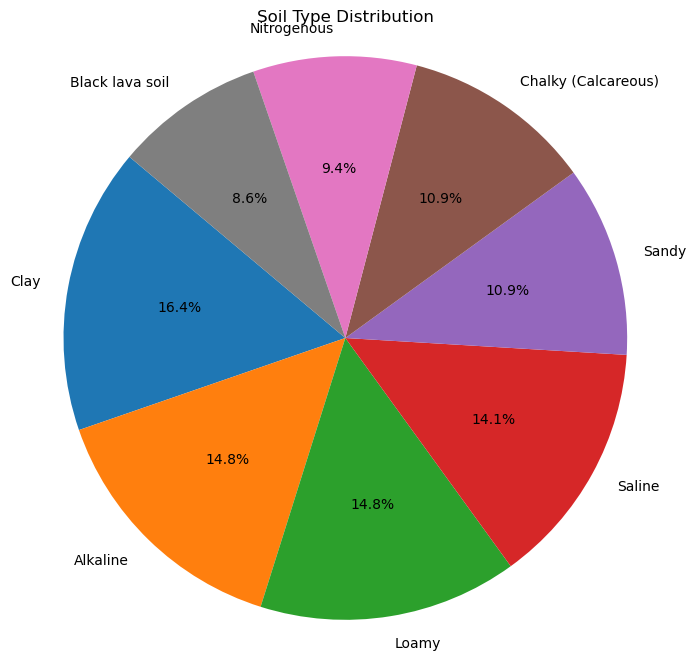

In [234]:
value_counts = df_Jodhpur['Soil_Type'].value_counts()
percentages = (value_counts / value_counts.sum()) * 100
# Create the pie plot
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
# Add a title
plt.title('Soil Type Distribution')
# Show the plot
plt.show()

<Axes: xlabel='pH_Level', ylabel='Count'>

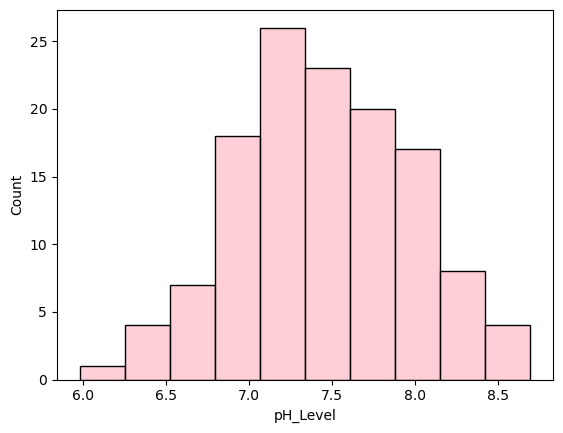

In [235]:
sns.histplot(df_Jodhpur['pH_Level'],color='pink')

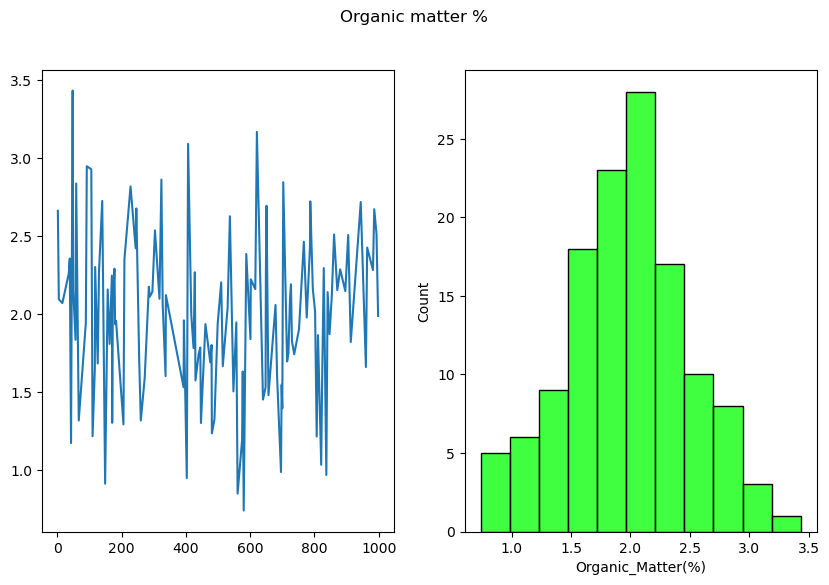

In [236]:
plt.figure(figsize=(10,6))
plt.suptitle('Organic matter % ')
plt.subplot(1,2,1)
plt.plot(df_Jodhpur['Organic_Matter(%)'])
plt.subplot(1,2,2)
sns.histplot(df_Jodhpur['Organic_Matter(%)'],color='lime')
plt.show()

Text(0.5, 1.0, 'pottasium kg per hectare')

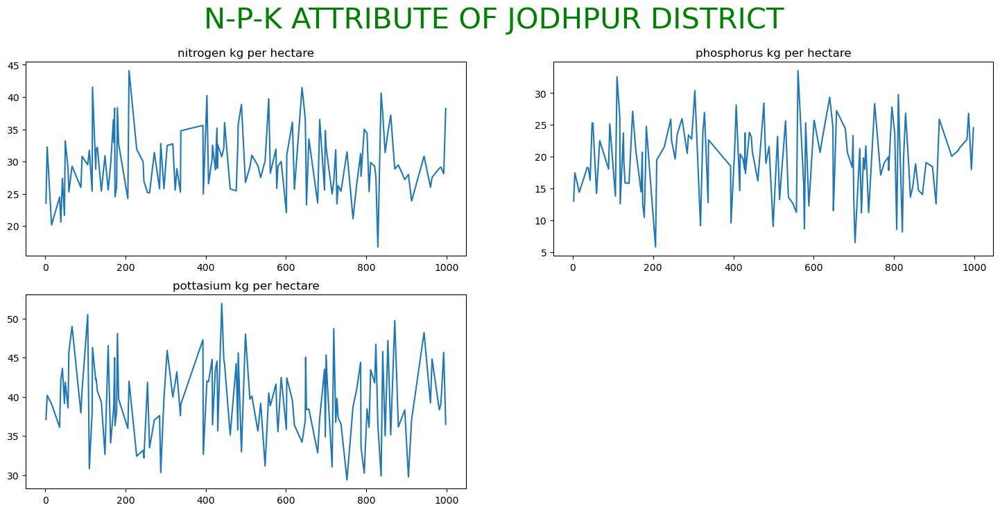

In [46]:
plt.figure(figsize=(18,8))
plt.suptitle('N-P-K ATTRIBUTE OF JODHPUR DISTRICT',fontsize=30,c='green')
plt.subplot(2,2,1)
plt.plot(df_Jodhpur['Nitrogen_Content(kg/ha)'])
plt.title('nitrogen kg per hectare')
plt.subplot(2,2,2)
plt.plot(df_Jodhpur['Phosphorus_Content(kg/ha)'])
plt.title('phosphorus kg per hectare')
plt.subplot(2,2,3)
plt.plot(df_Jodhpur['Potassium_Content(kg/ha)'])
plt.title('pottasium kg per hectare')


## analysis on kota district 

In [238]:
df_Kota.head()

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
18,Kota,Sandy,6.591010,2.379856,29.527706,22.098050,35.680585
34,Kota,Sandy,7.027127,2.304123,23.414340,23.880140,34.988915
35,Kota,Nitrogenous,7.123782,1.266607,27.492989,24.876562,42.578140
38,Kota,Nitrogenous,7.295157,2.356161,41.408259,16.911792,32.324799
42,Kota,Saline,8.091747,1.410980,38.336121,27.616193,43.678110


In [239]:
df_Kota['Soil_Type'].value_counts()

Clay                   20
Chalky (Calcareous)    19
Black lava soil        18
Saline                 16
Nitrogenous            13
Loamy                  10
Sandy                   9
Alkaline                9
Name: Soil_Type, dtype: int64

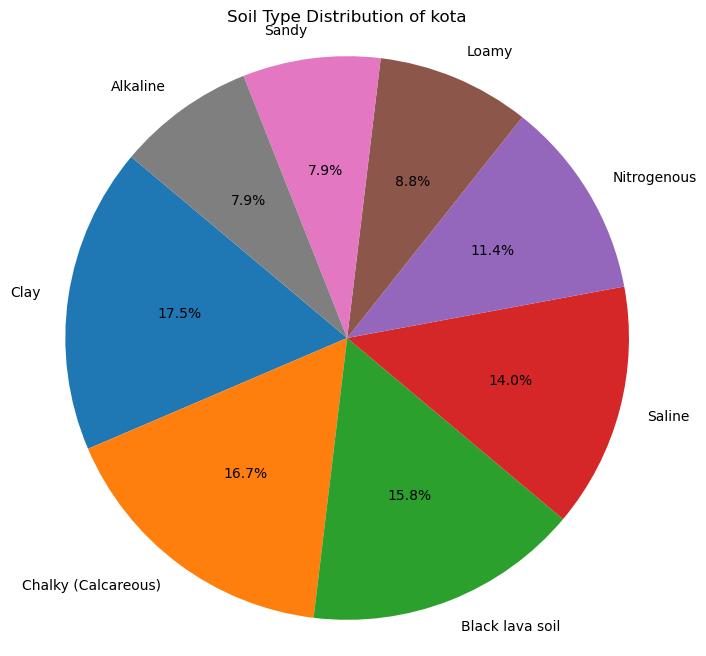

In [240]:
value_counts = df_Kota['Soil_Type'].value_counts()
percentages = (value_counts / value_counts.sum()) * 100
# Create the pie plot
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
# Add a title
plt.title('Soil Type Distribution of kota')
# Show the plot
plt.show()

<Axes: xlabel='pH_Level', ylabel='Count'>

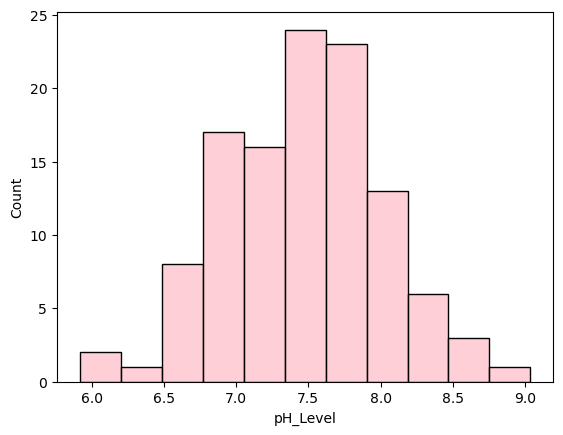

In [241]:
sns.histplot(df_Kota['pH_Level'],color='pink')

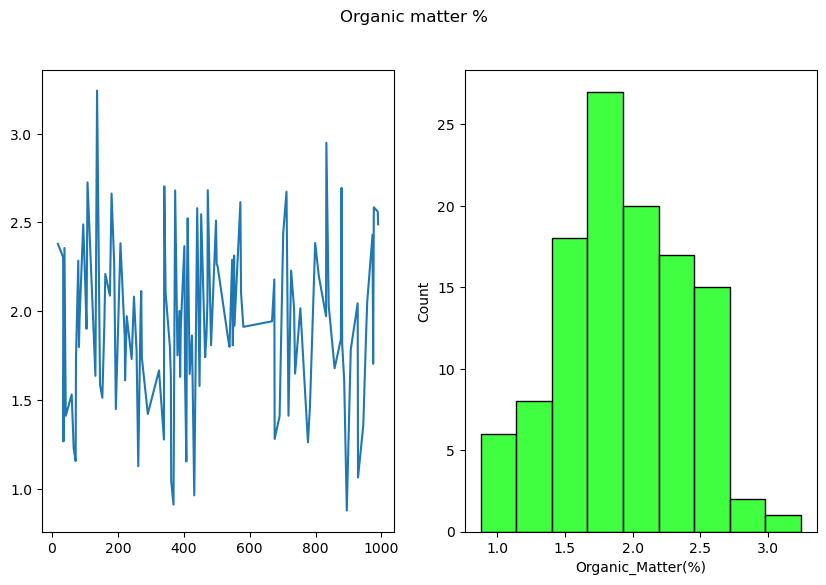

In [242]:
plt.figure(figsize=(10,6))
plt.suptitle('Organic matter % ')
plt.subplot(1,2,1)
plt.plot(df_Kota['Organic_Matter(%)'])
plt.subplot(1,2,2)
sns.histplot(df_Kota['Organic_Matter(%)'],color='lime')
plt.show()

Text(0.5, 1.0, 'pottasium kg per hectare')

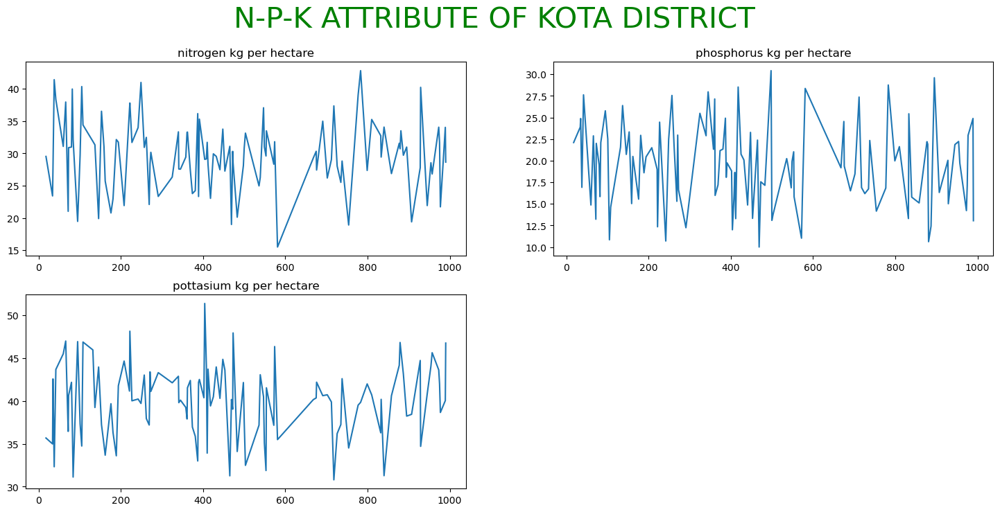

In [47]:
plt.figure(figsize=(18,8))
plt.suptitle('N-P-K ATTRIBUTE OF KOTA DISTRICT',fontsize=30,c='green')
plt.subplot(2,2,1)
plt.plot(df_Kota['Nitrogen_Content(kg/ha)'])
plt.title('nitrogen kg per hectare')
plt.subplot(2,2,2)
plt.plot(df_Kota['Phosphorus_Content(kg/ha)'])
plt.title('phosphorus kg per hectare')
plt.subplot(2,2,3)
plt.plot(df_Kota['Potassium_Content(kg/ha)'])
plt.title('pottasium kg per hectare')


## analysis of nagaur district

In [244]:
df_Nagaur.head()

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
14,Nagaur,Sandy,6.865335,2.851257,31.011644,28.159284,36.334835
19,Nagaur,Saline,8.139732,2.520862,32.917722,19.352414,42.899286
33,Nagaur,Chalky (Calcareous),6.624086,1.805038,30.790267,19.516882,37.920165
63,Nagaur,Chalky (Calcareous),7.708223,1.973048,25.088482,25.609289,51.600204
74,Nagaur,Loamy,7.461278,1.402353,37.254638,29.035983,31.586707


In [245]:
df_Nagaur['Soil_Type'].value_counts()

Black lava soil        19
Saline                 13
Sandy                  12
Chalky (Calcareous)    10
Loamy                   8
Alkaline                8
Nitrogenous             8
Clay                    7
Name: Soil_Type, dtype: int64

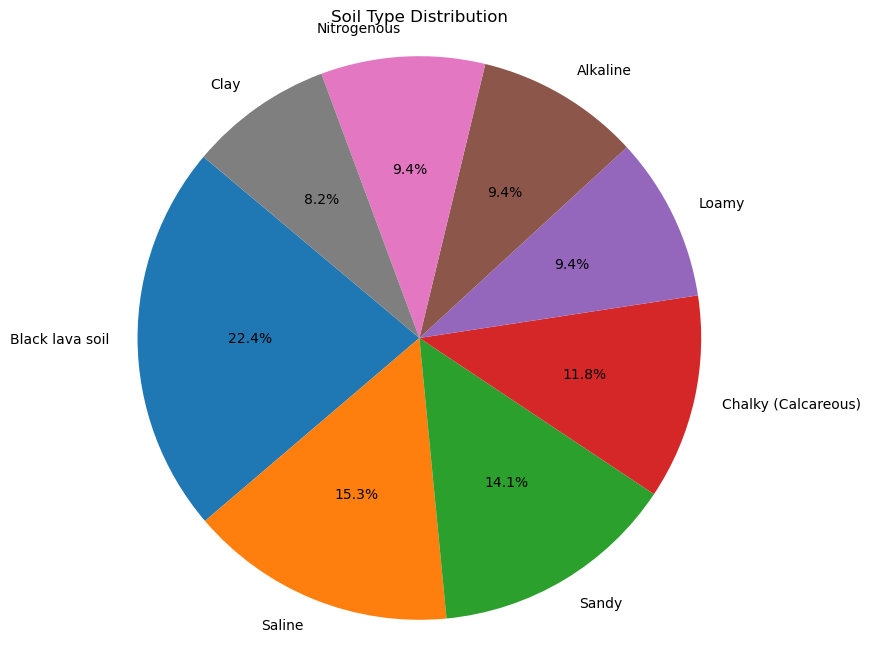

In [246]:
value_counts = df_Nagaur['Soil_Type'].value_counts()
percentages = (value_counts / value_counts.sum()) * 100
# Create the pie plot
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
# Add a title
plt.title('Soil Type Distribution')
# Show the plot
plt.show()

<Axes: xlabel='pH_Level', ylabel='Count'>

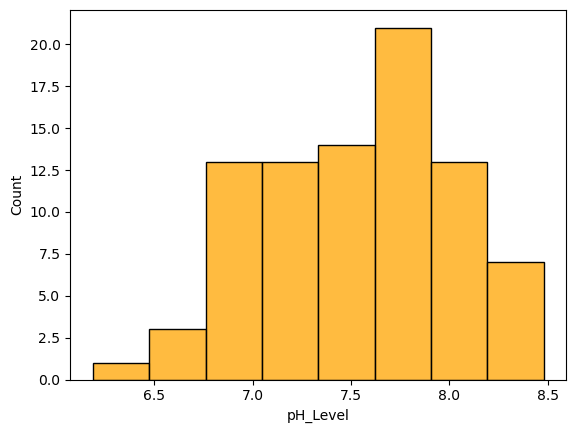

In [247]:
sns.histplot(df_Nagaur['pH_Level'],color='orange')

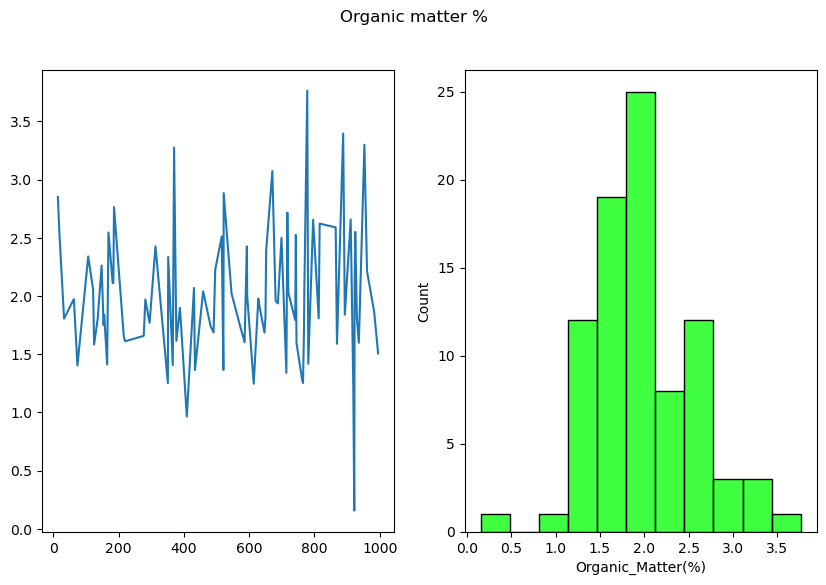

In [248]:
plt.figure(figsize=(10,6))
plt.suptitle('Organic matter % ')
plt.subplot(1,2,1)
plt.plot(df_Nagaur['Organic_Matter(%)'])
plt.subplot(1,2,2)
sns.histplot(df_Nagaur['Organic_Matter(%)'],color='lime')
plt.show()

Text(0.5, 1.0, 'pottasium kg per hectare')

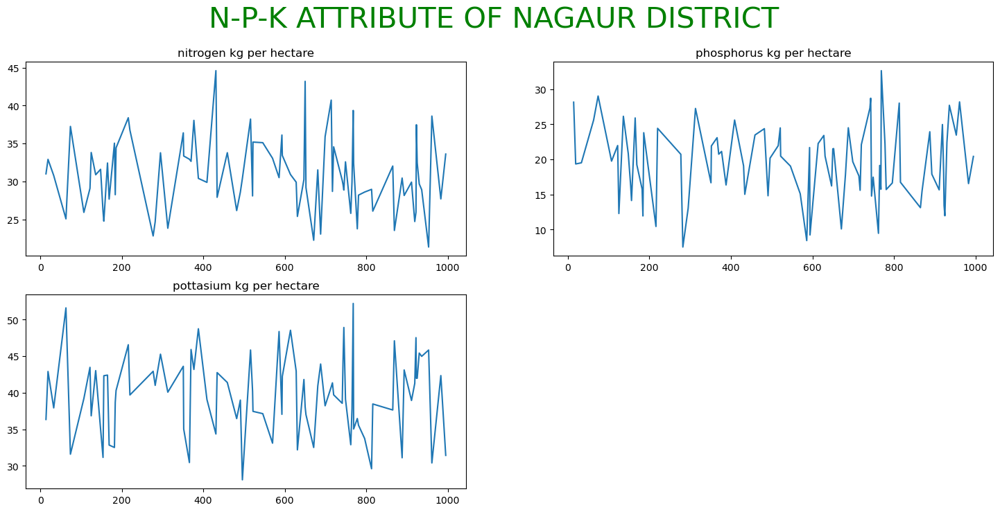

In [249]:
plt.figure(figsize=(18,8))
plt.suptitle('N-P-K ATTRIBUTE OF NAGAUR DISTRICT',fontsize=30,c='green')
plt.subplot(2,2,1)
plt.plot(df_Nagaur['Nitrogen_Content(kg/ha)'])
plt.title('nitrogen kg per hectare')
plt.subplot(2,2,2)
plt.plot(df_Nagaur['Phosphorus_Content(kg/ha)'])
plt.title('phosphorus kg per hectare')
plt.subplot(2,2,3)
plt.plot(df_Nagaur['Potassium_Content(kg/ha)'])
plt.title('pottasium kg per hectare')


In [250]:
## ANALYSIS ON SRI GANGANAGAR DISTRICT LANDS

In [251]:
df_SriGanganagar.head()

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
46,Sri Ganganagar,Chalky (Calcareous),7.291045,0.987096,24.645738,29.557095,33.597722
47,Sri Ganganagar,Nitrogenous,7.594740,2.503722,23.725387,20.923552,44.689578
55,Sri Ganganagar,Saline,8.177721,2.585099,30.671482,20.397989,42.770289
56,Sri Ganganagar,Saline,7.069148,2.015016,19.238082,24.382278,32.192534
62,Sri Ganganagar,Sandy,6.909063,2.224737,40.430235,14.926203,38.192686


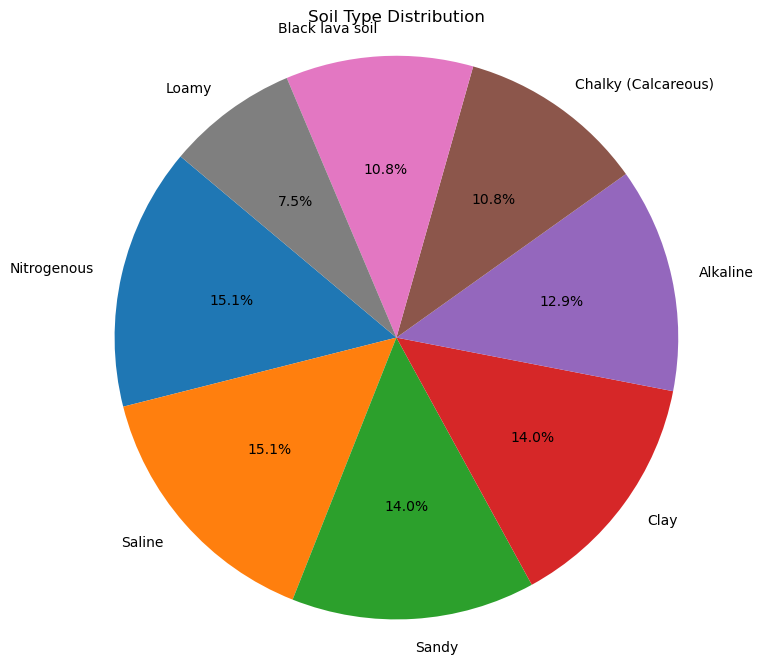

In [252]:
value_counts = df_SriGanganagar['Soil_Type'].value_counts()
percentages = (value_counts / value_counts.sum()) * 100
# Create the pie plot
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
# Add a title
plt.title('Soil Type Distribution')
# Show the plot
plt.show()

<Axes: xlabel='pH_Level', ylabel='Count'>

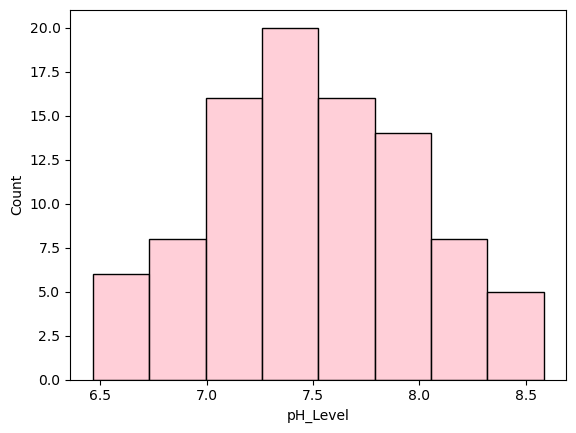

In [253]:
sns.histplot(df_SriGanganagar['pH_Level'],color='pink')

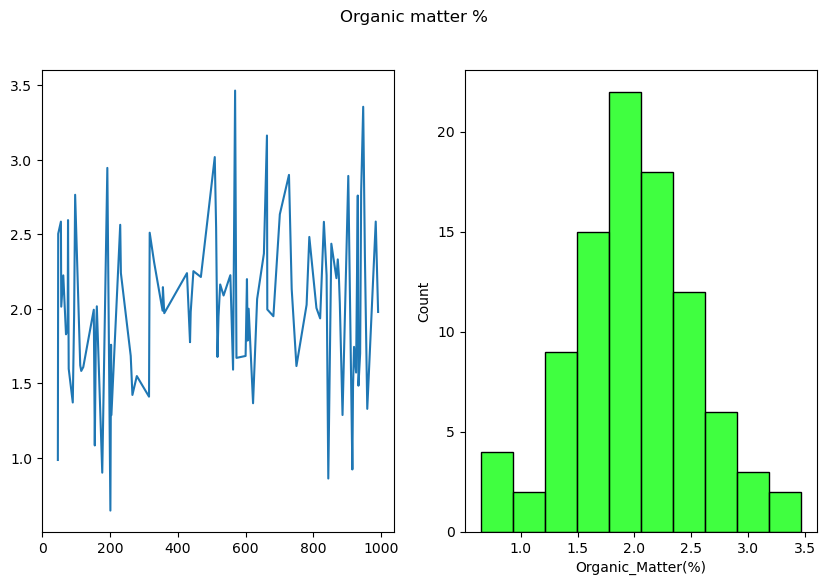

In [254]:
plt.figure(figsize=(10,6))
plt.suptitle('Organic matter % ')
plt.subplot(1,2,1)
plt.plot(df_SriGanganagar['Organic_Matter(%)'])
plt.subplot(1,2,2)
sns.histplot(df_SriGanganagar['Organic_Matter(%)'],color='lime')
plt.show()

Text(0.5, 1.0, 'pottasium kg per hectare')

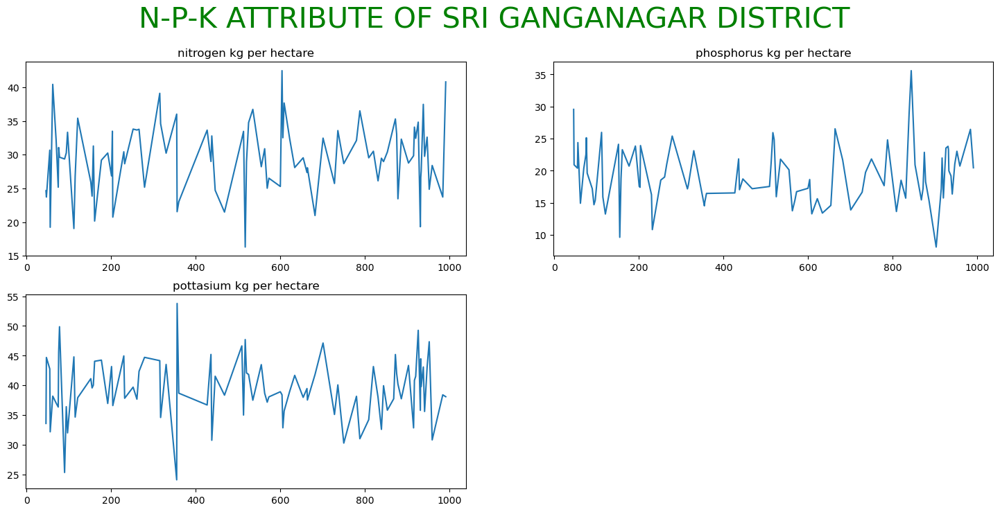

In [255]:
plt.figure(figsize=(18,8))
plt.suptitle('N-P-K ATTRIBUTE OF SRI GANGANAGAR DISTRICT',fontsize=30,c='green')
plt.subplot(2,2,1)
plt.plot(df_SriGanganagar['Nitrogen_Content(kg/ha)'])
plt.title('nitrogen kg per hectare')
plt.subplot(2,2,2)
plt.plot(df_SriGanganagar['Phosphorus_Content(kg/ha)'])
plt.title('phosphorus kg per hectare')
plt.subplot(2,2,3)
plt.plot(df_SriGanganagar['Potassium_Content(kg/ha)'])
plt.title('pottasium kg per hectare')


In [256]:
#ANALYSIS OF  UDAIPUR DISTRICT

In [257]:
df_Udaipur.head()

,District,Soil_Type,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
9,Udaipur,Black lava soil,6.475029,2.579537,28.318726,22.127450,45.986235
10,Udaipur,Loamy,6.814163,1.645279,28.557257,16.081232,48.674683
11,Udaipur,Loamy,7.071614,1.722227,31.021945,13.989252,38.021596
15,Udaipur,Loamy,8.409031,2.387578,32.765200,21.170122,38.757357
25,Udaipur,Sandy,7.869827,1.045322,36.591512,20.363403,37.942534


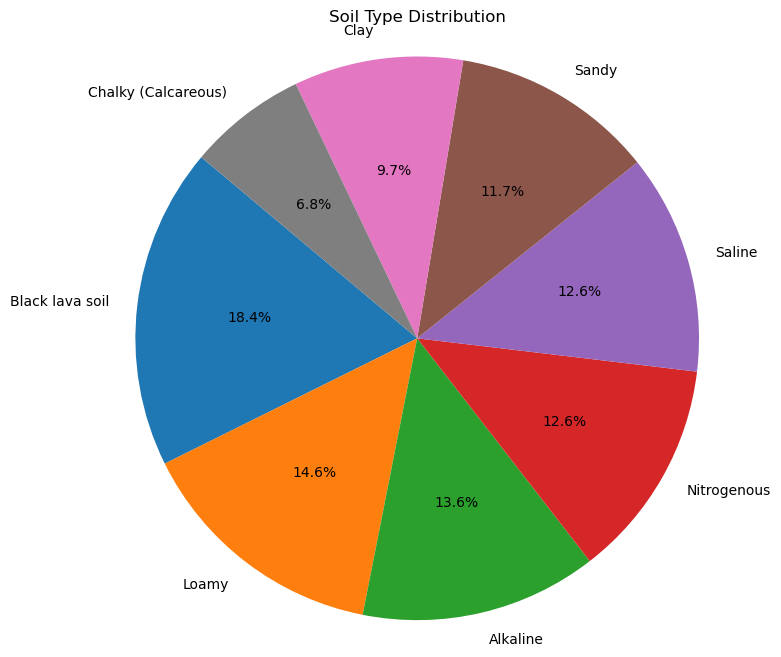

In [258]:
value_counts = df_Udaipur['Soil_Type'].value_counts()
percentages = (value_counts / value_counts.sum()) * 100
# Create the pie plot
plt.figure(figsize=(8, 8))
plt.pie(percentages, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.
# Add a title
plt.title('Soil Type Distribution')
# Show the plot
plt.show()

<Axes: xlabel='pH_Level', ylabel='Count'>

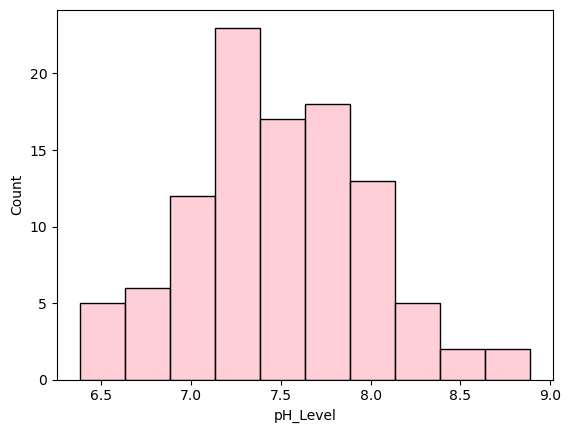

In [259]:
sns.histplot(df_Udaipur['pH_Level'],color='pink')

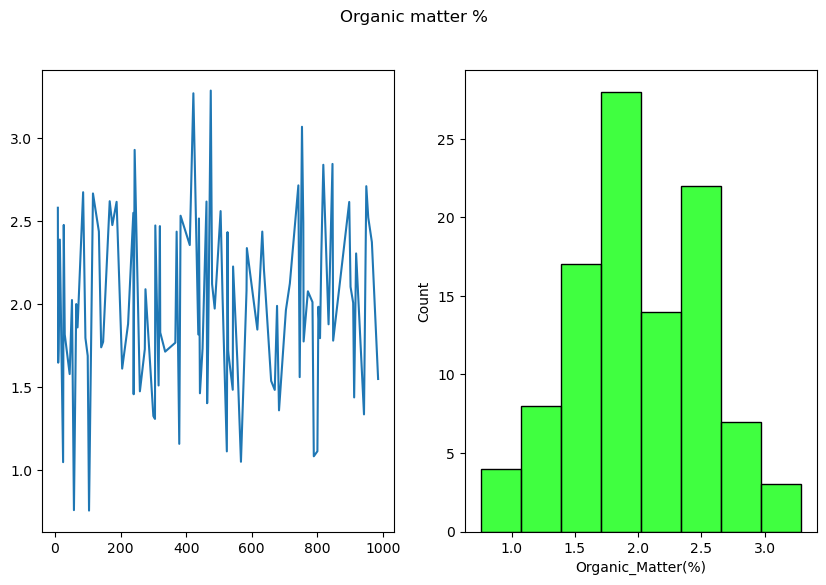

In [260]:
plt.figure(figsize=(10,6))
plt.suptitle('Organic matter % ')
plt.subplot(1,2,1)
plt.plot(df_Udaipur['Organic_Matter(%)'])
plt.subplot(1,2,2)
sns.histplot(df_Udaipur['Organic_Matter(%)'],color='lime')
plt.show()

Text(0.5, 1.0, 'pottasium kg per hectare')

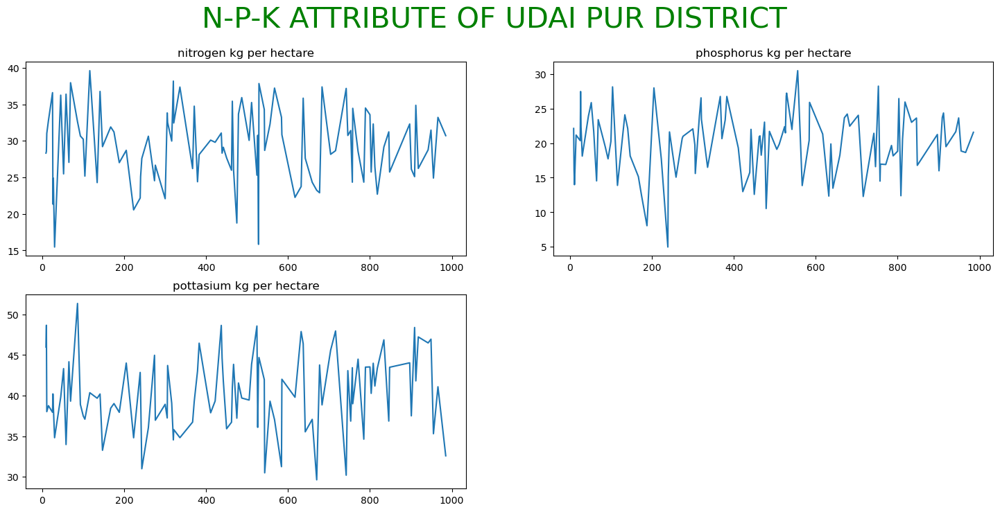

In [261]:
plt.figure(figsize=(18,8))
plt.suptitle('N-P-K ATTRIBUTE OF UDAI PUR DISTRICT',fontsize=30,c='green')
plt.subplot(2,2,1)
plt.plot(df_Udaipur['Nitrogen_Content(kg/ha)'])
plt.title('nitrogen kg per hectare')
plt.subplot(2,2,2)
plt.plot(df_Udaipur['Phosphorus_Content(kg/ha)'])
plt.title('phosphorus kg per hectare')
plt.subplot(2,2,3)
plt.plot(df_Udaipur['Potassium_Content(kg/ha)'])
plt.title('pottasium kg per hectare')


# LETS BRING OUT THE STATS

In [262]:
df_Ajmer.describe()

,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
count,106.000000,106.000000,106.000000,106.000000,106.000000
mean,7.472186,2.020277,30.398360,19.666500,39.963523
std,0.560703,0.583519,5.666926,4.666778,4.872117
min,5.889492,0.814170,11.994574,9.151613,25.838370
25%,7.182275,1.598421,27.296663,16.616638,36.940749
50%,7.421025,2.041772,30.172899,19.923227,39.932305
75%,7.866415,2.424260,33.533516,22.546405,42.665454
max,8.971524,3.621546,44.326060,33.034296,54.121102


In [263]:
df_Alwar.describe()

,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
count,98.000000,98.000000,98.000000,98.000000,98.000000
mean,7.553004,2.014300,29.621343,19.411370,40.176260
std,0.495700,0.470426,5.416641,5.318233,4.651363
min,6.298166,1.169458,17.341153,7.535948,30.263288
25%,7.198010,1.626932,25.799661,16.559680,36.885188
50%,7.577375,1.996433,29.785753,19.494072,39.846472
75%,7.899442,2.273132,33.343779,22.716962,43.704165
max,8.527097,3.293954,45.564551,33.210060,53.609561


In [264]:
df_bhilwara.describe()

,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
count,85.000000,85.000000,85.000000,85.000000,85.000000
mean,7.493613,2.000057,29.195424,20.775882,39.453946
std,0.535725,0.520934,4.668178,5.202101,4.999578
min,6.445081,0.662716,18.901110,6.462281,29.110161
25%,7.088962,1.704303,25.815098,17.367224,35.807497
50%,7.511598,2.036668,28.865288,20.970260,39.112020
75%,7.874873,2.345236,32.494416,24.835891,42.254813
max,8.748708,3.549150,39.560027,34.677031,54.678290


In [265]:
df_Hanumangarh.describe()

,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
count,85.000000,85.000000,85.000000,85.000000,85.000000
mean,7.551773,1.904887,30.435180,19.834993,40.279589
std,0.475100,0.393049,5.022732,5.200064,5.355776
min,6.255836,1.184332,20.252191,5.749849,26.436937
25%,7.223411,1.603270,26.631049,16.259520,37.561833
50%,7.579045,1.908350,29.964775,20.096906,40.861272
75%,7.874950,2.155555,34.468488,22.767848,44.113914
max,8.526486,2.710252,40.920484,33.334526,52.261850


In [266]:
df_jaipur.describe()

,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
count,103.000000,103.000000,103.000000,103.000000,103.000000
mean,7.455707,2.064744,29.634243,19.837221,39.831310
std,0.546523,0.485369,5.522268,4.869795,4.778198
min,6.223225,0.690933,15.726867,7.868040,27.823438
25%,7.047290,1.732204,25.994520,16.326414,36.867799
50%,7.462827,2.015698,29.186481,19.887820,40.072545
75%,7.835352,2.384881,33.038542,23.799572,42.698950
max,8.750450,3.202419,45.760284,31.357249,50.556482


In [267]:
df_Jodhpur.describe()

,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
count,128.000000,128.000000,128.000000,128.000000,128.000000
mean,7.454888,1.985176,29.906864,19.495916,39.576122
std,0.539340,0.523773,4.984886,5.795027,4.975501
min,5.977672,0.738861,16.740860,5.804607,29.380036
25%,7.107771,1.658080,25.816402,15.211109,36.262117
50%,7.436855,2.003795,29.363363,19.718175,39.103381
75%,7.835371,2.283551,32.686102,23.723961,43.248663
max,8.697181,3.434202,44.073272,33.515138,51.908568


In [268]:
df_Kota.describe()

,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
count,114.000000,114.000000,114.000000,114.000000,114.000000
mean,7.460185,1.938007,29.794718,19.470072,40.096340
std,0.540864,0.475870,5.439197,4.816409,4.269064
min,5.914787,0.877207,15.502431,10.005555,30.798668
25%,7.078724,1.633322,27.283521,15.790433,37.205996
50%,7.460024,1.914883,29.819414,19.726601,40.336458
75%,7.809647,2.280864,33.229412,22.492135,43.054973
max,9.038430,3.242595,42.802515,30.413302,51.385432


In [269]:
df.columns

Index(['District', 'Soil_Type', 'pH_Level', 'Organic_Matter(%)',
       'Nitrogen_Content(kg/ha)', 'Phosphorus_Content(kg/ha)',
       'Potassium_Content(kg/ha)'],
      dtype='object')

In [270]:
IMPORTANT=df.groupby('District').mean()

In [271]:
IMPORTANT

,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
District,,,,,
Ajmer,7.472186,2.020277,30.398360,19.666500,39.963523
Alwar,7.553004,2.014300,29.621343,19.411370,40.176260
Bhilwara,7.493613,2.000057,29.195424,20.775882,39.453946
Hanumangarh,7.551773,1.904887,30.435180,19.834993,40.279589
Jaipur,7.455707,2.064744,29.634243,19.837221,39.831310
Jodhpur,7.454888,1.985176,29.906864,19.495916,39.576122
Kota,7.460185,1.938007,29.794718,19.470072,40.096340
Nagaur,7.527281,1.995183,30.909347,19.609709,39.698829
Sri Ganganagar,7.512621,2.017380,29.627871,19.340775,39.352132


In [272]:
df.groupby('Soil_Type').mean()

,pH_Level,Organic_Matter(%),Nitrogen_Content(kg/ha),Phosphorus_Content(kg/ha),Potassium_Content(kg/ha)
Soil_Type,,,,,
Alkaline,7.592802,1.970451,29.611645,20.102388,39.791115
Black lava soil,7.515361,1.997554,29.309727,20.036111,40.503668
Chalky (Calcareous),7.423194,1.936928,30.085445,19.744676,39.777619
Clay,7.432185,2.094807,29.707380,19.079858,39.910324
Loamy,7.564105,2.040614,30.519322,19.256549,39.712199
Nitrogenous,7.405290,1.974997,29.850310,19.603439,39.828059
Saline,7.530385,1.965008,29.854063,20.038749,40.019283
Sandy,7.487491,1.958704,30.327597,19.907666,39.312637


In [273]:
grouped_data = df.groupby(['District', 'Soil_Type']).mean()


In [274]:
pd.set_option('display.max_rows', 1000)

In [275]:
grouped_data

pH_Level  Organic_Matter(%)  \
District       Soil_Type                                          
Ajmer          Alkaline             7.559221           2.025108   
               Black lava soil      7.467226           2.182744   
               Chalky (Calcareous)  7.585004           1.688812   
               Clay                 7.313454           2.025314   
               Loamy                7.650348           2.243714   
               Nitrogenous          7.294822           2.022957   
               Saline               7.553718           2.093061   
               Sandy                7.377181           1.847003   
Alwar          Alkaline             7.744578           1.767108   
               Black lava soil      7.524858           1.922791   
               Chalky (Calcareous)  7.623862           2.275296   
               Clay                 7.604872           2.153282   
               Loamy                7.692620           1.923177   
               Nitrogenous          7.426245           2.009772   
               Saline               7.485325           2.179536   
               Sandy                7.456183           1.875505   
Bhilwara       Alkaline             7.499764           1.902004   
               Black lava soil      7.578149           2.034696   
               Chalky (Calcareous)  7.636710           2.252040   
               Clay                 7.101795           2.275334   
               Loamy                7.332672           2.002102   
               Nitrogenous          7.347523           1.920284   
               Saline               7.540033           1.863951   
               Sandy                7.897935           2.012332   
Hanumangarh    Alkaline             7.638860           2.069867   
               Black lava soil      7.665222           1.914405   
               Chalky (Calcareous)  7.538516           1.814235   
               Clay                 7.634317           1.901616   
               Loamy                7.433943           1.964397   
               Nitrogenous          7.624918           1.846360   
               Saline               7.421377           1.792853   
               Sandy                7.170727           1.793338   
Jaipur         Alkaline             7.582161           2.072962   
               Black lava soil      7.294427           2.067576   
               Chalky (Calcareous)  7.019872           2.043207   
               Clay                 7.537831           2.094355   
               Loamy                7.638100           2.295995   
               Nitrogenous          7.627767           2.021634   
               Saline               7.394710           1.806680   
               Sandy                7.456094           2.031560   
Jodhpur        Alkaline             7.563501           2.019315   
               Black lava soil      7.611537           2.033532   
               Chalky (Calcareous)  7.349132           1.830636   
               Clay                 7.308792           2.059766   
               Loamy                7.631705           2.057200   
               Nitrogenous          7.252885           1.988984   
               Saline               7.464094           1.912638   
               Sandy                7.430646           1.935755   
Kota           Alkaline             7.531146           1.886733   
               Black lava soil      7.535451           1.824571   
               Chalky (Calcareous)  7.463635           2.044612   
               Clay                 7.317266           1.956148   
               Loamy                7.457568           1.924777   
               Nitrogenous          7.323029           1.865805   
               Saline               7.724942           2.004779   
               Sandy                7.279352           1.951076   
Nagaur         Alkaline             7.649484           1.743152   
               Black lava soil      7.475834           2.057398   
               C

In [276]:
soil_type_counts = pd.DataFrame(df.groupby(['District', 'Soil_Type']).size())
soil_type_counts

0
District       Soil_Type              
Ajmer          Alkaline             11
               Black lava soil      18
               Chalky (Calcareous)  11
               Clay                 12
               Loamy                12
               Nitrogenous          10
               Saline               14
               Sandy                18
Alwar          Alkaline              9
               Black lava soil      18
               Chalky (Calcareous)   8
               Clay                 13
               Loamy                10
               Nitrogenous          14
               Saline               15
               Sandy                11
Bhilwara       Alkaline             17
               Black lava soil       9
               Chalky (Calcareous)   7
               Clay                  8
               Loamy                 8
               Nitrogenous          14
               Saline               12
               Sandy                10
Hanumangarh    Alkaline             14
               Black lava soil      11
               Chalky (Calcareous)   9
               Clay                 12
               Loamy                12
               Nitrogenous          14
               Saline                8
               Sandy                 5
Jaipur         Alkaline             14
               Black lava soil      11
               Chalky (Calcareous)  12
               Clay                 14
               Loamy                16
               Nitrogenous          11
               Saline               12
               Sandy                13
Jodhpur        Alkaline             19
               Black lava soil      11
               Chalky (Calcareous)  14
               Clay                 21
               Loamy                19
               Nitrogenous          12
               Saline               18
               Sandy                14
Kota           Alkaline              9
               Black lava soil      18
               Chalky (Calcareous)  19
               Clay                 20
               Loamy                10
               Nitrogenous          13
               Saline               16
               Sandy                 9
Nagaur         Alkaline              8
               Black lava soil      19
               Chalky (Calcareous)  10
               Clay                  7
               Loamy                 8
               Nitrogenous           8
               Saline               13
               Sandy                12
Sri Ganganagar Alkaline             12
               Black lava soil      10
               Chalky (Calcareous)  10
               Clay                 13
               Loamy                 7
               Nitrogenous          14
               Saline               14
               Sandy                13
Udaipur        Alkaline             14
               Black lava soil      19
               Chalky (Calcareous)   7
               Clay                 10
               Loamy                15
               Nitrogenous          13
               Saline               13
               Sandy                12

In [277]:
max_nitrogen = df.groupby('District')['Nitrogen_Content(kg/ha)'].max()
max_nitrogen

District
Ajmer             44.326060
Alwar             45.564551
Bhilwara          39.560027
Hanumangarh       40.920484
Jaipur            45.760284
Jodhpur           44.073272
Kota              42.802515
Nagaur            44.590868
Sri Ganganagar    42.460920
Udaipur           39.601838
Name: Nitrogen_Content(kg/ha), dtype: float64

In [278]:
min_phosphorus = pd.DataFrame(df.groupby(['District', 'Soil_Type'])['Phosphorus_Content(kg/ha)'].min())

In [279]:
min_phosphorus

Phosphorus_Content(kg/ha)
District       Soil_Type                                     
Ajmer          Alkaline                             10.413256
               Black lava soil                      12.087860
               Chalky (Calcareous)                   9.151613
               Clay                                 15.168768
               Loamy                                10.454013
               Nitrogenous                           9.913306
               Saline                               10.267374
               Sandy                                10.964793
Alwar          Alkaline                             11.261817
               Black lava soil                      11.635530
               Chalky (Calcareous)                   7.535948
               Clay                                  7.560890
               Loamy                                11.371144
               Nitrogenous                           9.380262
               Saline                               12.963533
               Sandy                                 9.337022
Bhilwara       Alkaline                             13.346474
               Black lava soil                      10.244491
               Chalky (Calcareous)                  17.926847
               Clay                                 16.750866
               Loamy                                12.975915
               Nitrogenous                           6.462281
               Saline                               15.356040
               Sandy                                11.666183
Hanumangarh    Alkaline                             12.607265
               Black lava soil                      13.174891
               Chalky (Calcareous)                  15.256257
               Clay                                  6.130925
               Loamy                                11.916433
               Nitrogenous                          13.299376
               Saline                                9.548486
               Sandy                                 5.749849
Jaipur         Alkaline                              8.736033
               Black lava soil                      11.348686
               Chalky (Calcareous)                   9.748213
               Clay                                 11.068123
               Loamy                                13.247220
               Nitrogenous                           7.868040
               Saline                               14.130633
               Sandy                                14.241594
Jodhpur        Alkaline                             11.263892
               Black lava soil                       9.028088
               Chalky (Calcareous)                  11.173062
               Clay                                  8.571114
               Loamy                                 8.162612
               Nitrogenous                           6.483260
               Saline                                5.804607
               Sandy                                 9.142143
Kota           Alkaline                             14.870659
               Black lava soil                      10.005555
               Chalky (Calcareous)                  13.089912
               Clay                                 13.051099
               Loamy                                10.624963
               Nitrogenous                          15.780731
               Saline                               11.030394
               Sandy                                10.841589
Nagaur         Alkaline                              7.509695
               Black lava soil                       9.231347
               Chalky (Calcareous)                  10.441797
               Clay                                 11.942163
               Loamy                                 9.465554
               Nitrogenous                           8.429780
               Saline                               13.435157
      

In [280]:
min_pottasium = pd.DataFrame(df.groupby(['District', 'Soil_Type'])['Potassium_Content(kg/ha)'].min())
min_pottasium

Potassium_Content(kg/ha)
District       Soil_Type                                    
Ajmer          Alkaline                            32.644368
               Black lava soil                     33.640405
               Chalky (Calcareous)                 34.029053
               Clay                                33.961203
               Loamy                               30.650918
               Nitrogenous                         25.838370
               Saline                              30.953661
               Sandy                               32.627487
Alwar          Alkaline                            35.149379
               Black lava soil                     30.263288
               Chalky (Calcareous)                 35.485955
               Clay                                30.851591
               Loamy                               31.029282
               Nitrogenous                         32.606114
               Saline                              31.863441
               Sandy                               35.944996
Bhilwara       Alkaline                            29.110161
               Black lava soil                     33.649695
               Chalky (Calcareous)                 34.678900
               Clay                                33.165708
               Loamy                               32.467374
               Nitrogenous                         33.388263
               Saline                              33.260021
               Sandy                               32.526219
Hanumangarh    Alkaline                            28.908261
               Black lava soil                     26.436937
               Chalky (Calcareous)                 35.238418
               Clay                                28.398422
               Loamy                               34.359687
               Nitrogenous                         28.419281
               Saline                              35.100372
               Sandy                               37.355008
Jaipur         Alkaline                            32.215245
               Black lava soil                     36.440134
               Chalky (Calcareous)                 32.724727
               Clay                                33.263730
               Loamy                               27.823438
               Nitrogenous                         28.065351
               Saline                              28.915906
               Sandy                               29.838231
Jodhpur        Alkaline                            29.380036
               Black lava soil                     32.639815
               Chalky (Calcareous)                 30.799611
               Clay                                29.752628
               Loamy                               30.241985
               Nitrogenous                         34.869596
               Saline                              35.015342
               Sandy                               31.154748
Kota           Alkaline                            34.104459
               Black lava soil                     34.920606
               Chalky (Calcareous)                 32.999646
               Clay                                30.798668
               Loamy                               33.604846
               Nitrogenous                         31.281637
               Saline                              31.265522
               Sandy                               31.119941
Nagaur         Alkaline                            34.349106
               Black lava soil                     29.596297
               Chalky (Calcareous)                 32.834241
               Clay                                28.078466
               Loamy                               30.443416
               Nitrogenous                         30.386141
               Saline                              31.421458
               Sandy                               32.176889
Sri Gangan

In [281]:
min_nitrogen = pd.DataFrame(df.groupby(['District', 'Soil_Type'])['Nitrogen_Content(kg/ha)'].min())
min_nitrogen

Nitrogen_Content(kg/ha)
District       Soil_Type                                   
Ajmer          Alkaline                           23.817609
               Black lava soil                    15.812468
               Chalky (Calcareous)                26.134851
               Clay                               11.994574
               Loamy                              25.616515
               Nitrogenous                        22.096980
               Saline                             19.567612
               Sandy                              23.545289
Alwar          Alkaline                           20.022341
               Black lava soil                    21.354086
               Chalky (Calcareous)                22.049291
               Clay                               20.108874
               Loamy                              22.206065
               Nitrogenous                        22.532451
               Saline                             22.519206
               Sandy                              17.341153
Bhilwara       Alkaline                           20.122561
               Black lava soil                    18.901110
               Chalky (Calcareous)                24.683228
               Clay                               20.569356
               Loamy                              23.618478
               Nitrogenous                        19.356330
               Saline                             21.245122
               Sandy                              26.794429
Hanumangarh    Alkaline                           20.252191
               Black lava soil                    24.769395
               Chalky (Calcareous)                24.240012
               Clay                               23.207130
               Loamy                              24.484078
               Nitrogenous                        22.780372
               Saline                             21.310977
               Sandy                              25.570146
Jaipur         Alkaline                           20.894570
               Black lava soil                    24.518898
               Chalky (Calcareous)                20.253141
               Clay                               15.839222
               Loamy                              15.726867
               Nitrogenous                        24.029067
               Saline                             21.021784
               Sandy                              24.095138
Jodhpur        Alkaline                           21.657004
               Black lava soil                    24.957756
               Chalky (Calcareous)                23.875001
               Clay                               21.147594
               Loamy                              16.740860
               Nitrogenous                        20.584249
               Saline                             24.244231
               Sandy                              20.164651
Kota           Alkaline                           19.471765
               Black lava soil                    18.993783
               Chalky (Calcareous)                20.781032
               Clay                               21.030538
               Loamy                              18.912045
               Nitrogenous                        19.907561
               Saline                             15.502431
               Sandy                              21.920566
Nagaur         Alkaline                           24.707797
               Black lava soil                    22.275320
               Chalky (Calcareous)                25.088482
               Clay                               21.379691
               Loamy                              25.812971
               Nitrogenous                        26.103123
               Saline                             23.854082
               Sandy                              22.836644
Sri Ganganagar Alkaline                           19.050391
               B

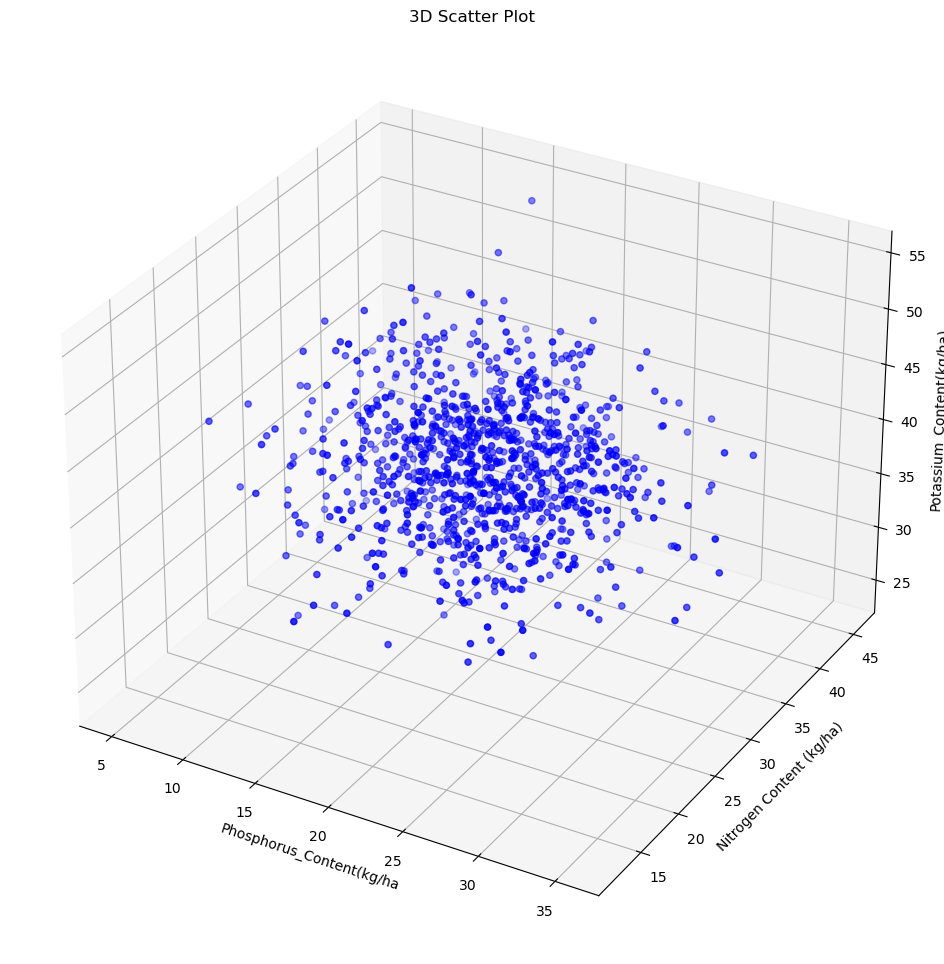

In [51]:
from mpl_toolkits.mplot3d import Axes3D

# Sample data (replace with your DataFrame)
fig = plt.figure(figsize=(16, 12))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(
    df['Phosphorus_Content(kg/ha)'],
    df['Nitrogen_Content(kg/ha)'],
    df['Potassium_Content(kg/ha)'],
    c='blue',
    marker='o'
)

ax.set_xlabel('Phosphorus_Content(kg/ha')
ax.set_ylabel('Nitrogen Content (kg/ha)')
ax.set_zlabel('Potassium_Content(kg/ha)')

plt.title('3D Scatter Plot')
plt.show()


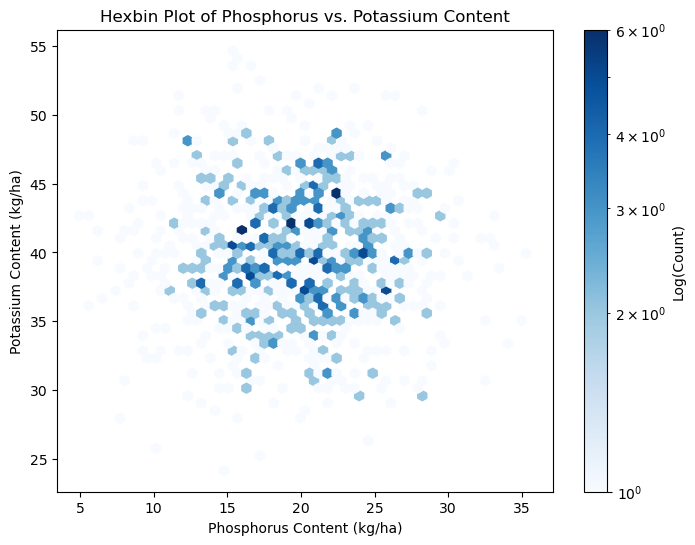

In [283]:
import matplotlib.pyplot as plt

# Sample data (replace with your DataFrame)
plt.figure(figsize=(8, 6))
hb = plt.hexbin(
    df['Phosphorus_Content(kg/ha)'],
    df['Potassium_Content(kg/ha)'],
    gridsize=50,
    cmap='Blues',
    bins='log'
)
plt.colorbar(hb, label='Log(Count)')
plt.title('Hexbin Plot of Phosphorus vs. Potassium Content')
plt.xlabel('Phosphorus Content (kg/ha)')
plt.ylabel('Potassium Content (kg/ha)')
plt.show()


### Group by 'District' and 'Soil_Type' and Calculate the Variability in Nitrogen Conten

In [284]:
def coefficient_of_variation(x):
    return x.std() / x.mean()

cv_nitrogen = df.groupby(['District', 'Soil_Type'])['Nitrogen_Content(kg/ha)'].agg(coefficient_of_variation)

In [285]:
coefficient_of_variation(df['Potassium_Content(kg/ha)'])

0.1222418965951223

The coefficient of variation (CV), also known as relative standard deviation, is a statistical measure used to express the relative variability of a dataset, taking into account the scale or magnitude of the data. It's particularly useful when comparing the variability of different datasets that have different units of measurement or magnitudes. The CV is calculated as the ratio of the standard deviation to the mean (average) of the data and is typically expressed as a percentage:


CV=(SD/MEAN)*100

### Violin plots combine the features of box plots and kernel density plots to provide a more comprehensive view of the data distribution

<Axes: title={'center': 'violin plot of district wise phosphorus content'}, xlabel='District', ylabel='Phosphorus_Content(kg/ha)'>

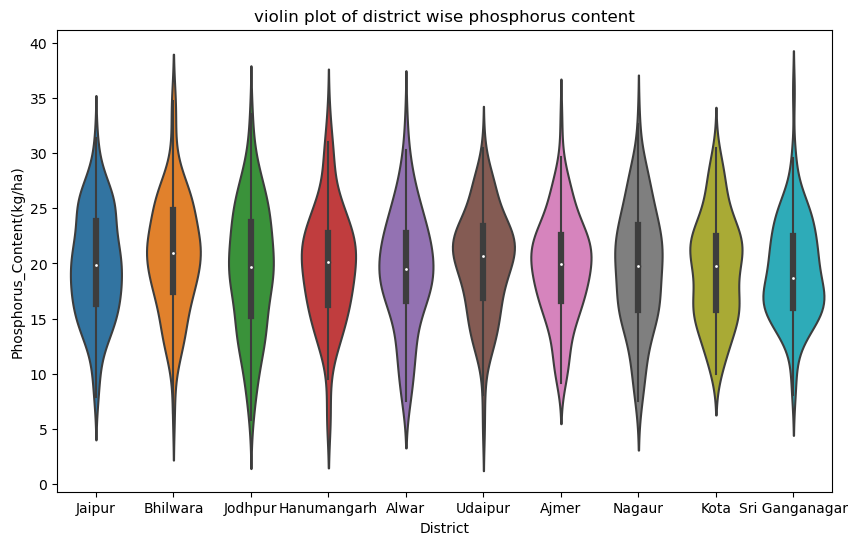

In [52]:
plt.figure(figsize=(10,6))
plt.title('violin plot of district wise phosphorus content')
sns.violinplot(x=df['District'],y=df['Phosphorus_Content(kg/ha)'])

In [287]:
df.columns

Index(['District', 'Soil_Type', 'pH_Level', 'Organic_Matter(%)',
       'Nitrogen_Content(kg/ha)', 'Phosphorus_Content(kg/ha)',
       'Potassium_Content(kg/ha)'],
      dtype='object')

In [288]:
pivot_df

Nitrogen_Content(kg/ha)  \
District       Soil_Type                                      
Ajmer          Alkaline                           31.549478   
               Black lava soil                    29.537820   
               Chalky (Calcareous)                30.800749   
               Clay                               30.949945   
               Loamy                              31.437119   
               Nitrogenous                        29.430454   
               Saline                             29.940083   
               Sandy                              30.143465   
Alwar          Alkaline                           29.929649   
               Black lava soil                    30.016915   
               Chalky (Calcareous)                28.546386   
               Clay                               28.736107   
               Loamy                              31.225862   
               Nitrogenous                        30.468214   
               Saline                             29.089541   
               Sandy                              28.738466   
Bhilwara       Alkaline                           30.670359   
               Black lava soil                    31.145907   
               Chalky (Calcareous)                27.937506   
               Clay                               28.040194   
               Loamy                              26.590107   
               Nitrogenous                        28.067781   
               Saline                             28.104306   
               Sandy                              31.709620   
Hanumangarh    Alkaline                           28.308151   
               Black lava soil                    29.823043   
               Chalky (Calcareous)                31.111971   
               Clay                               32.839380   
               Loamy                              31.959291   
               Nitrogenous                        30.558587   
               Saline                             28.307407   
               Sandy                              30.150293   
Jaipur         Alkaline                           28.022644   
               Black lava soil                    32.313099   
               Chalky (Calcareous)                29.430505   
               Clay                               27.838295   
               Loamy                              31.422000   
               Nitrogenous                        29.951719   
               Saline                             27.668449   
               Sandy                              30.570881   
Jodhpur        Alkaline                           30.572894   
               Black lava soil                    27.959607   
               Chalky (Calcareous)                29.737534   
               Clay                               29.799215   
               Loamy                              29.508228   
               Nitrogenous                        29.133205   
               Saline                             31.085032   
               Sandy                              30.553108   
Kota           Alkaline                           28.461964   
               Black lava soil                    28.786189   
               Chalky (Calcareous)                30.182883   
               Clay                               30.389394   
               Loamy                              29.936223   
               Nitrogenous                        30.800438   
               Saline                             30.076084   
               Sandy                              28.893431   
Nagaur         Alkaline                           31.360437   
               Black lava soil                    28.978286   
               Chalky (Calcareous)                32.263292   
               Clay                               29.011861   
               Loamy                              29.982133   
               Nitrogenous                        32.816603   
    

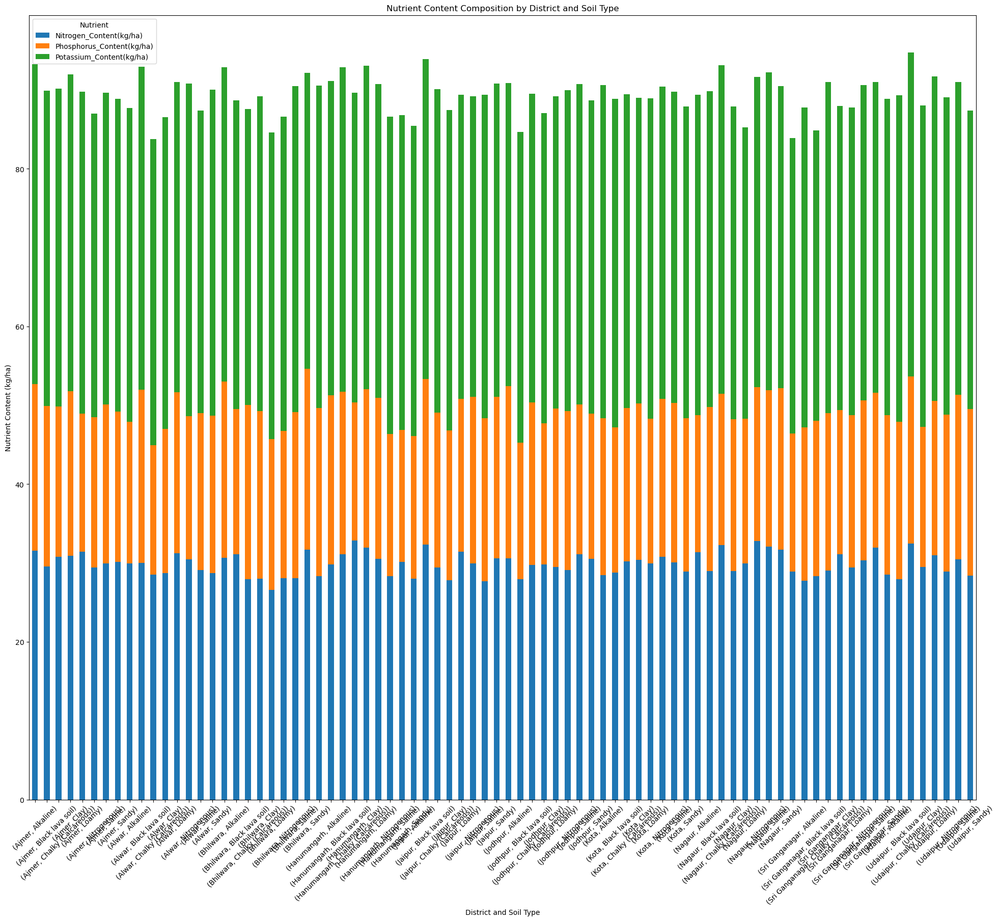

In [289]:
pivot_df = df.pivot_table(index=['District', 'Soil_Type'], values=['Nitrogen_Content(kg/ha)', 'Phosphorus_Content(kg/ha)', 'Potassium_Content(kg/ha)'])

# Create a stacked bar plot
pivot_df.plot(kind='bar', stacked=True, figsize=(24, 20))
plt.title('Nutrient Content Composition by District and Soil Type')
plt.xlabel('District and Soil Type')
plt.ylabel('Nutrient Content (kg/ha)')
plt.legend(title='Nutrient')
plt.xticks(rotation=45)  # Keep the x-axis labels horizontal

plt.show()

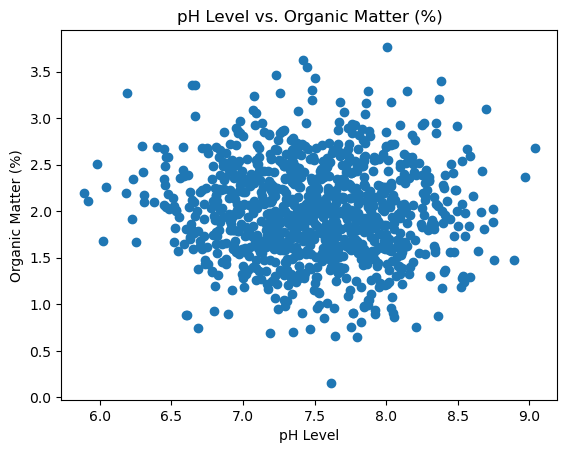

In [290]:

plt.scatter(df['pH_Level'], df['Organic_Matter(%)'])
plt.title('pH Level vs. Organic Matter (%)')
plt.xlabel('pH Level')
plt.ylabel('Organic Matter (%)')
plt.show()

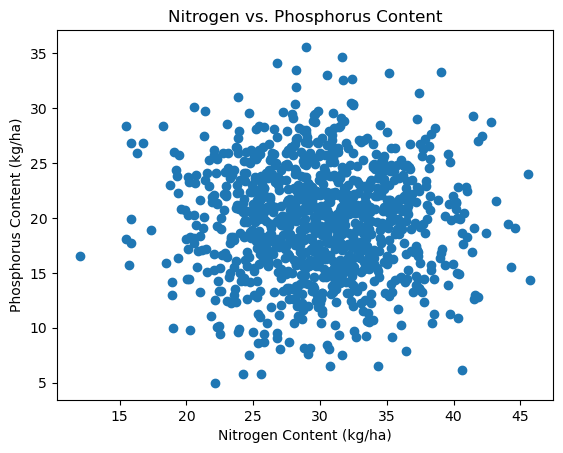

In [291]:
plt.scatter(df['Nitrogen_Content(kg/ha)'], df['Phosphorus_Content(kg/ha)'])
plt.title('Nitrogen vs. Phosphorus Content')
plt.xlabel('Nitrogen Content (kg/ha)')
plt.ylabel('Phosphorus Content (kg/ha)')
plt.show()

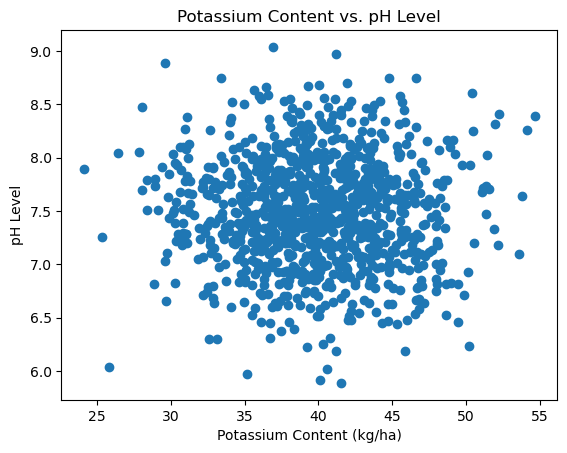

In [292]:

plt.scatter(df['Potassium_Content(kg/ha)'], df['pH_Level'])
plt.title('Potassium Content vs. pH Level')
plt.xlabel('Potassium Content (kg/ha)')
plt.ylabel('pH Level')
plt.show()


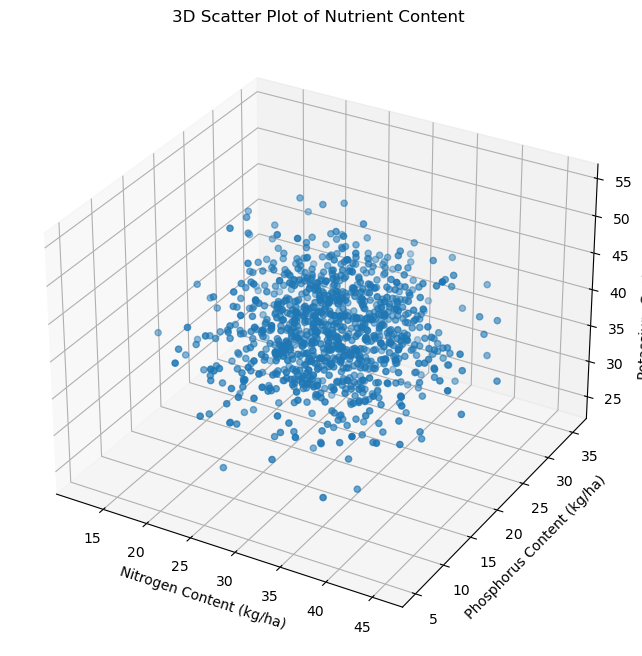

In [293]:

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(df['Nitrogen_Content(kg/ha)'], df['Phosphorus_Content(kg/ha)'], df['Potassium_Content(kg/ha)'])
ax.set_xlabel('Nitrogen Content (kg/ha)')
ax.set_ylabel('Phosphorus Content (kg/ha)')
ax.set_zlabel('Potassium Content (kg/ha)')
ax.set_title('3D Scatter Plot of Nutrient Content')

plt.show()

In [53]:

import plotly.express as px


fig = px.scatter_3d(df, x='Nitrogen_Content(kg/ha)', y='Phosphorus_Content(kg/ha)', z='Potassium_Content(kg/ha)', color='District',
                     title='Interactive 3D Scatter Plot')
fig.update_layout(scene=dict(xaxis_title='Nitrogen Content (kg/ha)', yaxis_title='Phosphorus Content (kg/ha)', zaxis_title='Potassium Content (kg/ha)'))
fig.show()


In [54]:
import plotly.graph_objs as go
fig = go.Figure(data=[go.Surface(z=df['pH_Level'].values.reshape(125,8), colorscale='Viridis')])

fig.update_layout(title='Interactive 3D Surface Plot of pH Levels', scene=dict(xaxis_title='District', yaxis_title='Soil Type', zaxis_title='pH Level'))
fig.show()

In [301]:
import pandas as pd
import plotly.graph_objs as go

# Sample data (replace with your DataFrame)
data = {
    'District': ['A', 'A', 'B', 'B', 'C', 'C'],
    'Soil_Type': ['Type1', 'Type2', 'Type1', 'Type2', 'Type1', 'Type2'],
    'pH_Level': [6.5, 6.8, 6.9, 7.0, 6.5, 6.7],
}

df1 = pd.DataFrame(data)

fig = go.Figure(data=[go.Surface(z=df1['pH_Level'].values.reshape(2, 3), colorscale='Viridis')])

fig.update_layout(title='Interactive 3D Surface Plot of pH Levels', scene=dict(xaxis_title='District', yaxis_title='Soil Type', zaxis_title='pH Level'))
fig.show()


In [55]:
df_Ajmer.to_csv('Ajmer_data.csv')

In [56]:
df_Alwar.to_csv('Ajmer_data.csv')
df_bhilwara.to_csv('bhilwara_data.csv')
df_Hanumangarh.to_csv('hanumangarh_data.csv')
df_jaipur.to_csv('jaipur_data.csv')
df_Jodhpur.to_csv('jodhpur_data.csv')
df_Kota.to_csv('kota_data.csv')
df_Nagaur.to_csv('nagaur_data.csv')
df_SriGanganagar.to_csv('sriganganagar_data.csv')
df_Udaipur.to_csv('upaipur_data.csv')